# Master Project: Predicting Strain Using Machine Learning

## Introduction

### Importing packages

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import sys
import time
import pickle

import xgboost as xgb
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import RobustScaler
import shap
import statistics as stat

from sklearn.neural_network import MLPRegressor
from sklearn import svm

np.random.seed(42)

## Method

### Loading data and defining key functions
In this section we set the config and define the functions for loading the data, training our models and testing.

In [2]:
def config():
    """
    CONFIG FUNCTION CONTAINING PARAMETERS AND OTHER MODEL DETAILS.
    """

    conf = {}

    conf['parameters'] = {'colsample_bytree':[0.9], 'alpha':[5], 'lambda':[0.1], 'learning_rate': [0.1],
                  'n_estimators': [50, 100, 200], 'max_depth':[3, 5, 7]}

    conf['model_details'] = {'objective' : "reg:squarederror",
                            'test_size' : 0.2}

    return conf


#### Function for importing data

In [3]:
def get_experiment_data(folder, filename, experiment, features, target, scale=True):
    """
    IMPORTS STRAIN DATASET FOR THE ROCK EXPERIMENTS FROM FOLDER AND
    CREATES DATAFRAME WITH FORMAT BASED ON TYPE OF TESTING.

    folder: The folder of the data
    filename: string with full name of file or list with string filenames
    experiment: Name of the experiment file             (not needed)
    features: Dataset features contained within the file
    target: String indicating which feature to predict
    scale: Determines if time array should be rescaled
    """

    if isinstance(filename,str):
        DF = pd.read_csv(folder+filename, delim_whitespace=True)
        DF = DF.dropna()

    elif isinstance(filename,list):
        #Scaling cannot be an option if you have multiple datasets
        DF = pd.read_csv(folder+filename[0], delim_whitespace=True)
        DF = DF.dropna()

        scaler = RobustScaler()
        DF[features] = scaler.fit_transform(DF[features].values)
        times = DF[target].values
        times = (times-min(times))/(max(times)-min(times))
        DF[target] = times

        for i in range(1,len(filename)):
            df = pd.read_csv(folder+filename[i], delim_whitespace=True)
            df = df.dropna()

            df[features] = scaler.fit_transform(df[features].values)
            times = df[target].values
            times = (times-min(times))/(max(times)-min(times))
            df[target] = times

            DF = DF.append(df)

    else:
        print("filename variable must be valid type, string or list of strings")

    scaler = RobustScaler()# works better with outliers
    #test other scalers?
    DF[features] = scaler.fit_transform(DF[features].values)


    if scale == True:
        times = DF[target].values
        times = (times-min(times))/(max(times)-min(times))
        DF[target] = times
        return DF, times

    else:
        times = DF[target].values
        return DF, times

In [4]:
def remove_outliers(dataset, target, feature_list, threshold=0.95, verbose=False):
    """
    Removing the top threshold percentile from the list of values within each feature but also wthin each different
    value of target
    dataset: The full dataset to be evaluated
    target: 
    feature_list: List of features to remove outliers from. Do not use same type of features multiple times
    i.e dp50 and dp70, because if an outlier is removed from dp50 it will also be removed from dp70.
    threshold: The percentile of data that qualifies as an outlier.
    """
        
    l = len(dataset[feature_list[0]])
    
    k = [key for key,val in target.items()]
    counter = [0]
    xvals = []
    
    
    for j in range(len(k)-1):
            if target[k[j]] != target[k[j+1]]: #j+1 doesnt work but need next element, but that returns list index OORange
                counter.append(k[j])
    
     
    for i in range(len(feature_list)):
        
        df_list = []
        for j in range(len(counter)-1):
            
            if dataset[feature_list[i]][counter[j]:counter[j+1]].empty == False:
                p = np.percentile( dataset[feature_list[i]][counter[j]:counter[j+1]], threshold ) #Want to find all threshold percentile keys within this subset and remove them
            
                kept = dataset[feature_list[i]][counter[j]:counter[j+1]]>p
                t = dataset[counter[j]:counter[j+1]][kept]
                
                df_list.append(t)
            else:
                break
    
        dataset = pd.concat(df_list)
        dataset.dropna()
    
    if verbose == True:
        print(f"datapoints in full dataframe {l},\ndatapoints without outliers {len(dataset)},\noutliers removed {l-len(dataset)}")
    
    return dataset


In [5]:
def remove_outliers_nointervals(dataset, target, feature_list, threshold=0.95, verbose=False):
    """
    Removing the top threshold percentile from the list of values within each feature but also wthin each different
    value of target
    dataset: The full dataset to be evaluated
    target: 
    feature_list: List of features to remove outliers from. Do not use same type of features multiple times
    i.e dp50 and dp70, because if an outlier is removed from dp50 it will also be removed from dp70.
    threshold: The percentile of data that qualifies as an outlier.
    """
        
    l = len(dataset[feature_list[0]])
    
    for i in range(len(feature_list)):
        p = np.percentile( dataset[feature_list[i]], threshold )
        dataset = dataset[dataset[feature_list[i]]>p]
    
    if verbose == True:
        print(f"datapoints in full dataframe {l},\ndatapoints without outliers {len(dataset)},\noutliers removed {l-len(dataset)}")
    
    return dataset


#### Functions for training models

In [6]:
def train_xgb_model(dataframe, target, features, config):
    """
    TRAINS AN XGBOOST MODEL ON A (PORTION OF) DATAFRAME
    dataframe: the data to train on
    target: String indicating which feature to predict
    features: Dataset features for the model to train on
    config: Dictionary that contains parameters, test_size and objective
    """
    xgb_model = xgb.XGBRegressor(objective=config['model_details']['objective'])  #regression
    grid_search = GridSearchCV(estimator=xgb_model, param_grid=config['parameters'], cv=10, n_jobs=-1)

    grid_search.fit(dataframe[features], dataframe[target])
    final_model = grid_search.best_estimator_

    return final_model

In [7]:
def train_nn_model(dataframe, target, features):
    """
    SOME OTHER MODEL TO TRAIN AND COMPARE
    """

    #NN_model = MLPRegressor(hidden_layer_sizes=(128,64,), max_iter=1000, activation='logistic', alpha=0.0005)  #regression
    #NN_model = MLPRegressor(hidden_layer_sizes=(128,64,), max_iter=1000, activation='relu', alpha=0.0005)  #regression
    NN_model = MLPRegressor(hidden_layer_sizes=(128,64,), max_iter=1500, activation='tanh', alpha=0.0005)  #regression
    
    #grid_search = GridSearchCV(estimator=NN_model, )
    #grid_search.fit(dataframe[features], dataframe[target])
    #final_model = grid_search.best_estimator_
    final_model = NN_model.fit(dataframe[features], dataframe[target])

    return final_model

In [8]:
def train_svm_model(dataframe, target, features):
    """
    SOME OTHER MODEL TO TRAIN AND COMPARE
    """

    svm_model = svm.SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)  #regression
    #grid_search = GridSearchCV(estimator=NN_model, )
    #grid_search.fit(dataframe[features], dataframe[target])
    #final_model = grid_search.best_estimator_
    final_model = svm_model.fit(dataframe[features], dataframe[target])
    
    return final_model

#### Test function

In [9]:
def test_regression_model(model,features,target, dataset):
    """
    FUNCTION TESTS MODEL ON TEST SET
    model: Trained model to test on test set
    features: Features/Predictors in the dataset
    target: String indicating which feature to predict
    dataset: The data to test on (can send in either train, test or different set)
    """

    predicts = model.predict(dataset[features])
    rmse = np.sqrt(mean_squared_error(dataset[target], predicts))
    r2 = r2_score(dataset[target], predicts)

    scores = [len(dataset[target]), rmse, r2]
    return scores

#### Plotting functions

In [10]:
def plot_data_time_evolutions(DataFrame, features, plot_strings):
    """
    PLOTS THE GIVEN FEATURE AGAINST THE NUMBER OF DATAPOINTS OF THE FEATURE
    DataFrame:
    feature:
    plot_strings:
    """
    x = np.linspace(0,len(DataFrame)-1,len(DataFrame))
    y = []
    for i in range(len(features)):
        y.append(DataFrame[features[i]])
    
        plt.plot(x, y[i]) #plt.plot(x , y, 'ro')
    plt.legend([features[i] for i in range(len(features))])
    plt.ylabel(plot_strings[2])
    plt.xlabel(plot_strings[1])
    plt.title(plot_strings[0])
    plt.show()
    
    return

In [11]:
def plot_data_evolutions(DataFrame, xfeature, features, plot_strings):
    """
    PLOTS THE GIVEN FEATURE AGAINST THE NUMBER OF DATAPOINTS OF THE FEATURE
    DataFrame:
    xfeature: The feature along the x-axis that the other feater will be plotted against
    feature:
    plot_strings:
    """
    y = []
    for i in range(len(features)):
        y.append(DataFrame[features[i]])
    
        plt.plot(xfeature , y[i]) #plt.plot(x , y, 'ro')
    plt.legend([features[i] for i in range(len(features))])
    plt.ylabel(plot_strings[2])
    plt.xlabel(plot_strings[1])
    plt.title(plot_strings[0])
    plt.show()
    return

In [12]:
def plot_data_errorbars(DataFrame, xfeature, features, plot_strings):
    """
    PLOTS THE GIVEN FEATURE AGAINST THE NUMBER OF DATAPOINTS OF THE FEATURE
    DataFrame:
    xfeature: The feature along the x-axis that the other feater will be plotted against
    feature:
    plot_strings:
    """
    
    counter = [0]
    xvals = []
    
    k = [key for key,val in xfeature.items()]
    
    for j in range(len(k)-1):
            if xfeature[k[j]] != xfeature[k[j+1]]: #j+1 doesnt work but need next element, but that returns list index OORange
                counter.append(k[j])
                xvals.append(xfeature[k[j]])
        
    for i in range(len(features)):
        
        ymeans = []
        ydev = []
        
        for j in range(len(counter)-1):
            mean = stat.mean( DataFrame[features[i]][counter[j]:counter[j+1] ] )
            dev = stat.stdev( DataFrame[features[i]][counter[j]:counter[j+1] ] )
            ymeans.append( mean )
            ydev.append( dev )
            
        plt.errorbar(xvals,ymeans,yerr=ydev,fmt='-o',capsize=3,markeredgewidth=2)
    
    plt.legend([features[i] for i in range(len(features))])
    plt.ylabel(plot_strings[2])
    plt.xlabel(plot_strings[1])
    plt.title(plot_strings[0])
    plt.show()
    return


In [13]:
def plot_data_errorbars_edit(DataFrame, xfeature, features, plot_strings):
    """
    PLOTS THE GIVEN FEATURE AGAINST THE NUMBER OF DATAPOINTS OF THE FEATURE
    DataFrame:
    xfeature: The feature along the x-axis that the other feater will be plotted against
    feature:
    plot_strings:
    """
    
    counter = [0]
    xvals = []
    
    k = [key for key,val in xfeature.items()]
    
    for j in range(len(k)-1):
            if xfeature[k[j]] != xfeature[k[j+1]]: #j+1 doesnt work but need next element, but that returns list index OORange
                counter.append(j)
                xvals.append(xfeature[j])
    
    for i in range(len(features)):
        
        ymeans = []
        ydev = []
        
        for j in range(len(counter)-1):
            mean = stat.mean( DataFrame[features[i]][counter[j]:counter[j+1] -1] )
            dev = stat.stdev( DataFrame[features[i]][counter[j]:counter[j+1] -1] )
            ymeans.append( mean )
            ydev.append( dev )
            
        plt.errorbar(xvals,ymeans,yerr=ydev,fmt='-o',capsize=3,markeredgewidth=2)
    
    plt.legend([features[i] for i in range(len(features))])
    plt.ylabel(plot_strings[2])
    plt.xlabel(plot_strings[1])
    plt.title(plot_strings[0])
    plt.show()
    return

In [14]:
def plot_feature_vs_prediction(DataFrame, feature, prediction, plot_strings):
    """
    PLOTS THE GIVEN FEATURE AGAINST THE NUMBER OF DATAPOINTS OF THE FEATURE
    DataFrame:
    feature:
    plot_strings:
    """
    x = np.linspace(0,len(DataFrame)-1,len(DataFrame))
    y = DataFrame[feature]
    
    plt.plot(x, prediction, 'r')
    plt.plot(x, y,'b') #plt.plot(x , y, 'ro')
    
    plt.legend(['prediction',feature])
    plt.ylabel(plot_strings[2])
    plt.xlabel(plot_strings[1])
    plt.title(plot_strings[0])
    plt.show()
    return

In [15]:
def plot_sns_score_matrix(score_matrix, train_list, test_list, plot_strings, figsize=(10,10), diagonal=True):
    """
    SEABORN CALLS ORDERED FOR PLOTTING SCORE MATRIX
    Takes the score_matrix and plots it with a title and
    the experiment_list as axes.
    """
    fig, ax = plt.subplots(figsize=figsize)
    g = sns.heatmap(score_matrix, annot=True, ax=ax, cmap="viridis", fmt=".2f")
    ax.set_title(plot_strings[0])
    g.set_xticklabels(test_list, rotation=45, horizontalalignment='right')
    g.set_yticklabels(train_list, rotation=45, horizontalalignment='right')
    ax.set_ylabel(plot_strings[2])
    ax.set_xlabel(plot_strings[1])

    if diagonal == True:
        [ax.add_patch(Rectangle((i,i),1,1,fill=False,edgecolor='red',lw=2)) for i in range(len(train_list))]
    plt.show()

    return

In [16]:
def plot_observed_vs_predicted(dataset, target, model, features, plot_strings):
    """
    PLOTS THE OBSERVED TARGET VS THE PREDICTION OF THE MODEL
    dataset:
    target:
    model:
    features:
    plot_strings: list containing strings for title 0, and labels 1, 2
    """
    preds = model.predict(dataset[features])

    plt.plot(dataset[target], preds, 'ko')
    plt.plot([0, max(dataset[target])], [0, max(preds)], 'r-')
    plt.ylabel(plot_strings[2])
    plt.xlabel(plot_strings[1])
    plt.title(plot_strings[0])
    plt.show()

In [17]:
def represent_model_results(model, dataset, features, target, scores):
    """
    STORES/PLOTS/PRINTS THE RESULTS OF THE MODEL ON TEST SET
    """

    shap_vals = shap.TreeExplainer(model).shap_values( dataset[features] ) # train[features]
    shap.summary_plot(shap_vals, dataset[features], plot_type="bar")
    
    return

In [18]:
def save_data_by_name(data, location, name, raw=False):
    """
    saves some data with a filename to a location
    """
    file = open(location+name, "w")
    file.write(data)
    file.close()
        
    return 

In [19]:
def save_model():
    
    return

In [20]:
def save_plot():
    
    return

### Selecting datasets
We can now start treating our data. We start by defining the list of experiment and features for our model to train on. We then go on to plot the correlation matrix of each dataset. The correlation matrix is interesting to compare to the feature importance in the xgboost models to see if it selects the features with the highest correlation as the most important feature. <- REWRITE
I also initially expect matrices with more correlation to make better models.

In [21]:
folder = '../strain_data_MS/' #rename experiment_folder -> add result_folder

experiments = ['FBL01', 'FBL02', 'ETNA01', 'ETNA02', 'MONZ03', 'MONZ04', 'MONZ05', 'WG01', 'WG02', 'WG04', 'GRS02', 'GRS03', 'ANS02', 'ANS03', 'ANS04', 'ANS05']
num_exps = len(experiments)
#features = ['dp_p90', 'dp_p75', 'dp_p50', 'dp_mean', 'dp_p25', 'dp_p10', 'dp_std', 'dp_num', 'dp_sum']
features = ['dn_p90', 'dn_p75', 'dn_p50', 'dn_mean', 'dn_p25', 'dn_p10', 'dn_std', 'dn_num', 'dn_sum', 'dp_p90', 'dp_p75', 'dp_p50', 'dp_mean', 'dp_p25', 'dp_p10', 'dp_std', 'dp_num', 'dp_sum', 'cur_p90', 'cur_p75', 'cur_p50', 'cur_mean', 'cur_p25', 'cur_p10', 'cur_std', 'cur_num', 'cur_sum']
rad = '5' #Experiment resolutions 5 and 2
target = "ep" #"sigD2" #save as strain if ep, stress elif sigD2, else dont save

filenames = ['strains_curr_'+experiment+'_g'+rad+'0.txt' for experiment in experiments]

result_folder = '../strain_model_output_MS/'
model_scores = 'model_scores_xgb_g'+rad+'0.txt'
score_str = "experiment mse r2 time\n"
model_score_matrix = 'transfer_learning_score_matrix_xgb_g'+rad+'0.txt'
model_preds = ['result_xgb_'+experiment+'_g'+rad+'0.txt' for experiment in experiments] #filenames for saved data
saved_models = ['../stored_models/model_xgb_'+experiment+'_g'+rad+'0.pkl' for experiment in experiments] #filenames for saved models using pickle


conf = config()

models = []
r2_train_vector = np.zeros(num_exps)
r2_test_matrix = np.zeros((num_exps,num_exps))

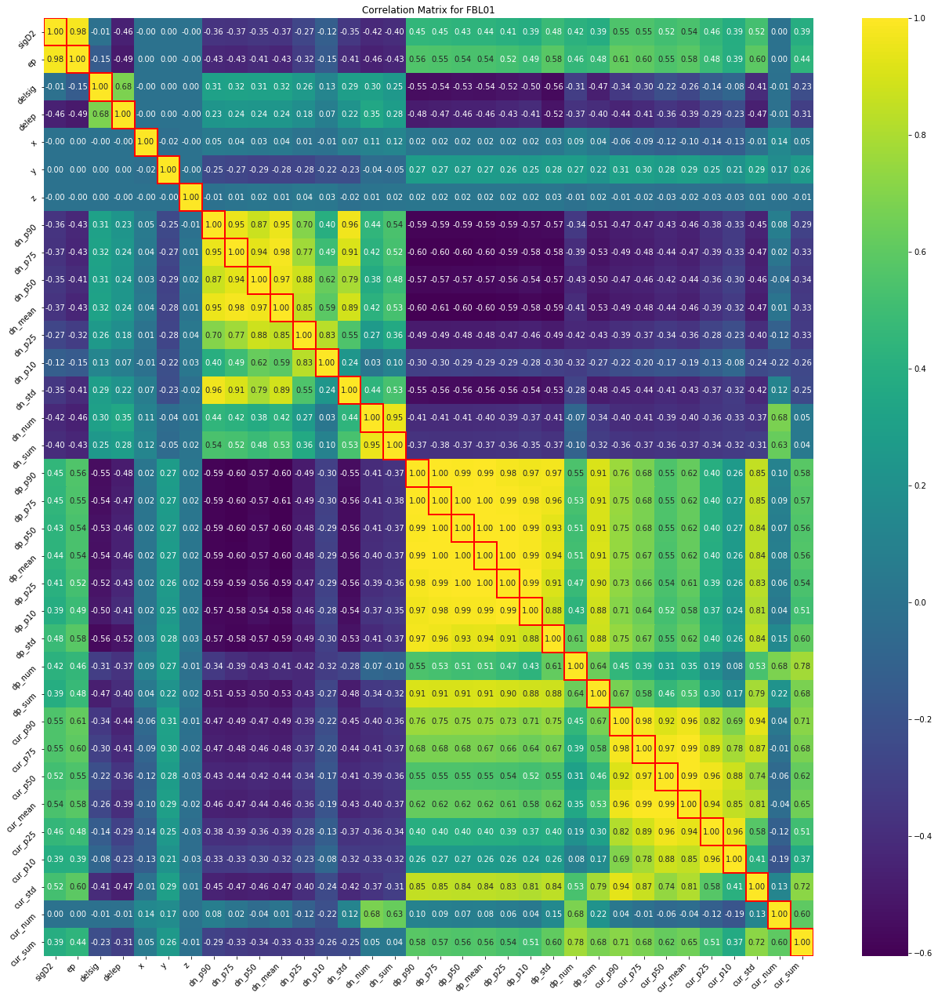

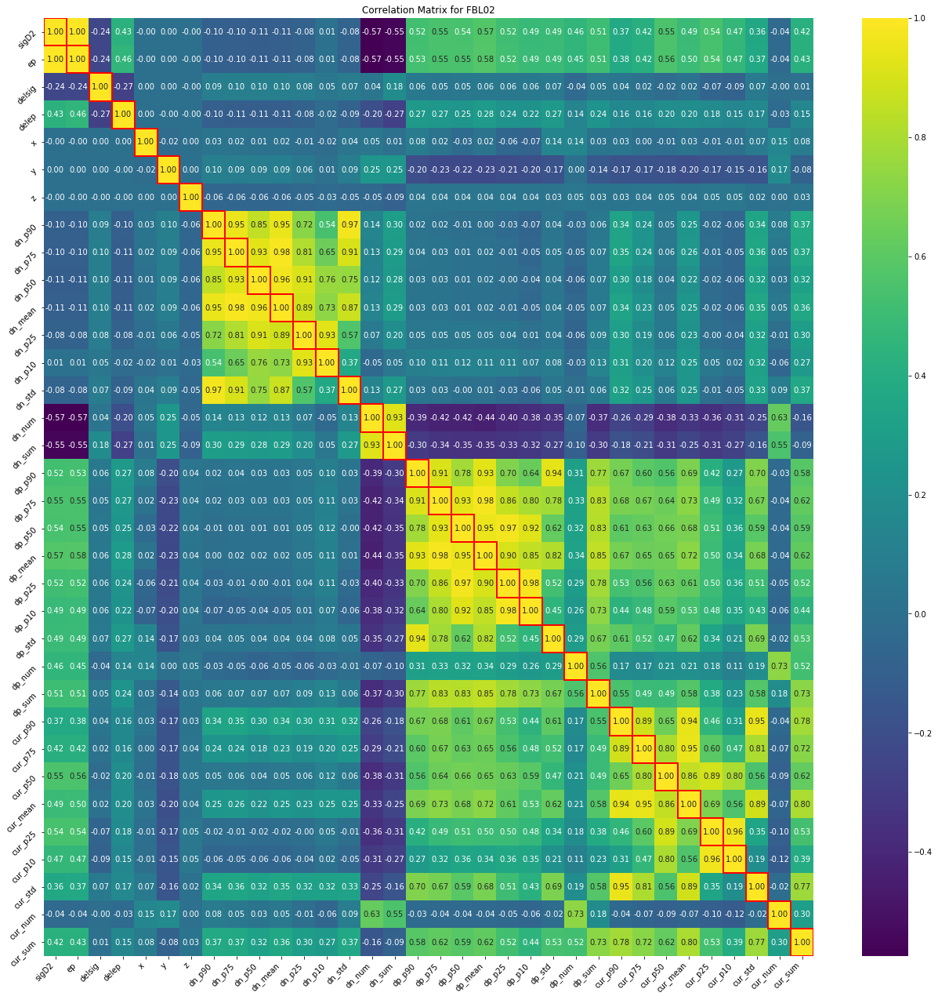

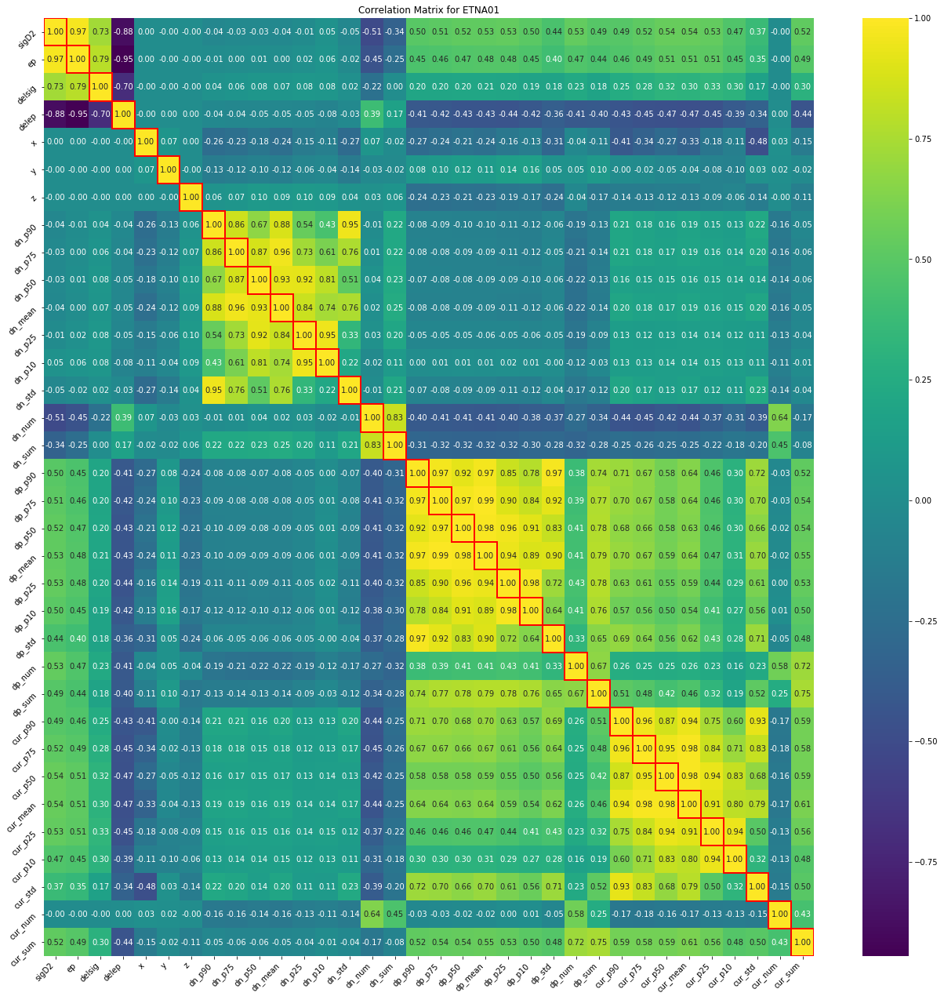

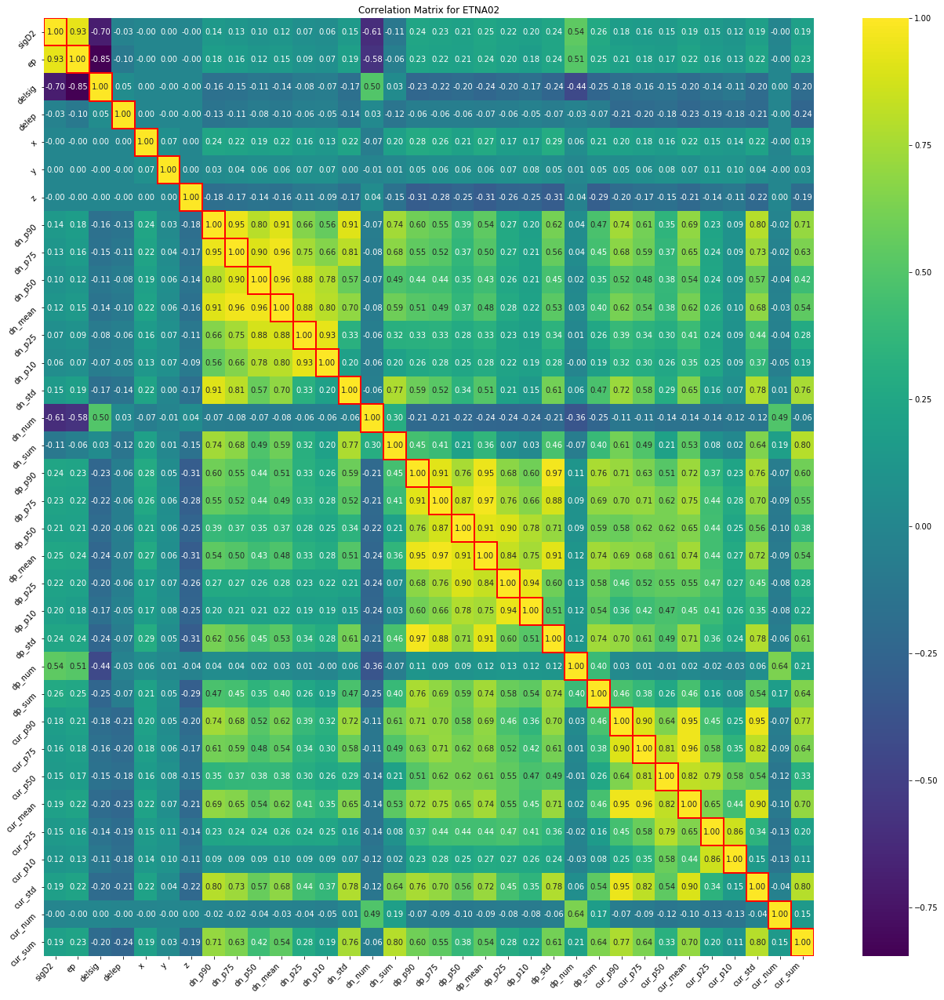

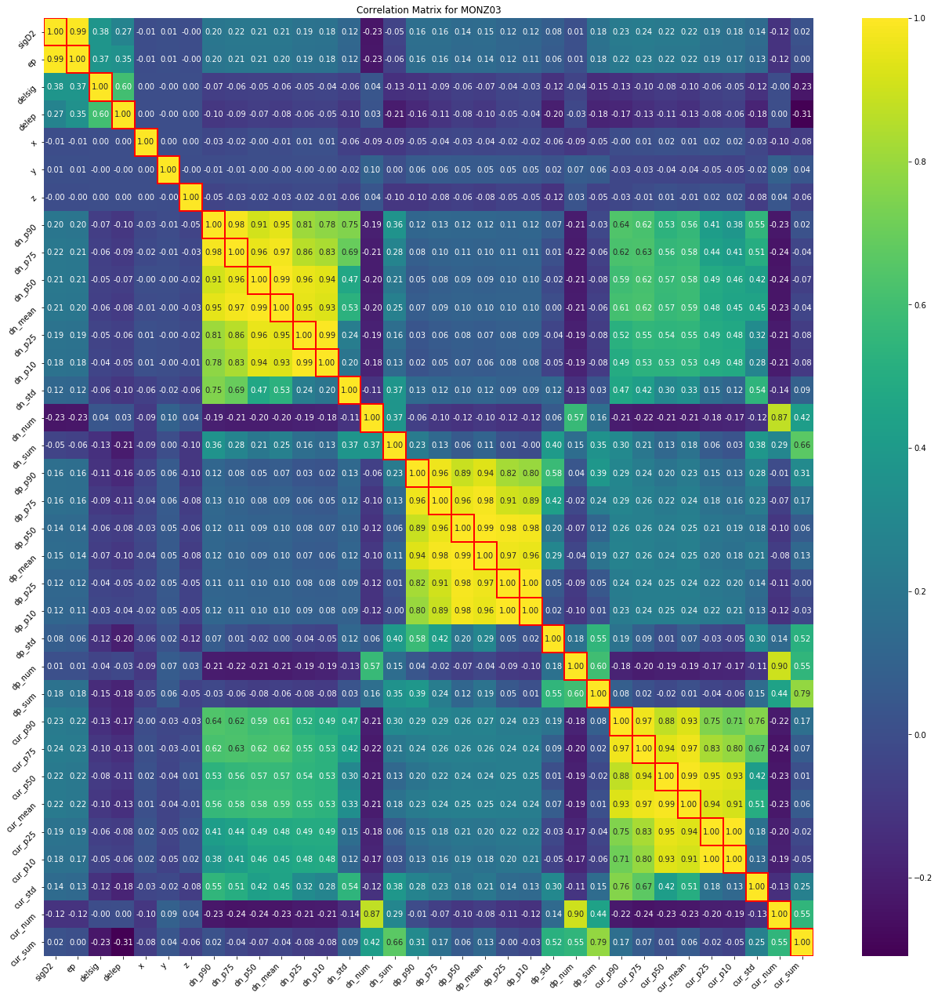

...

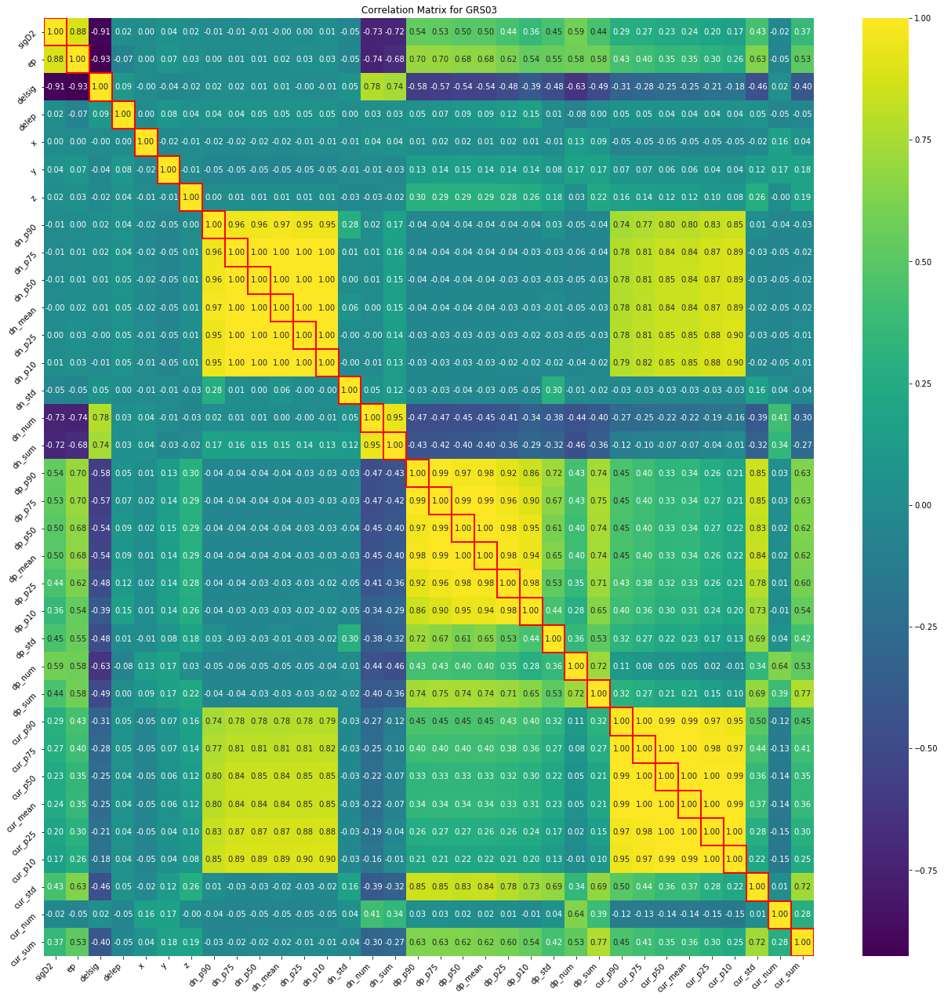

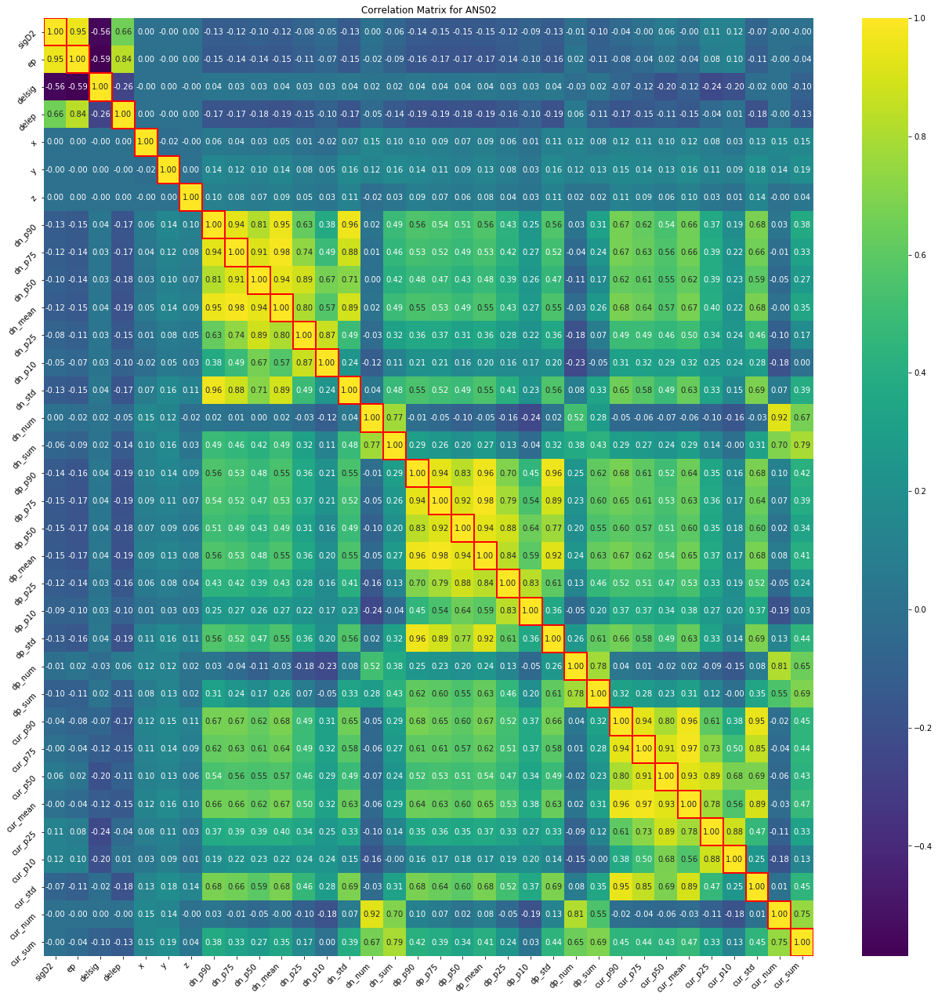

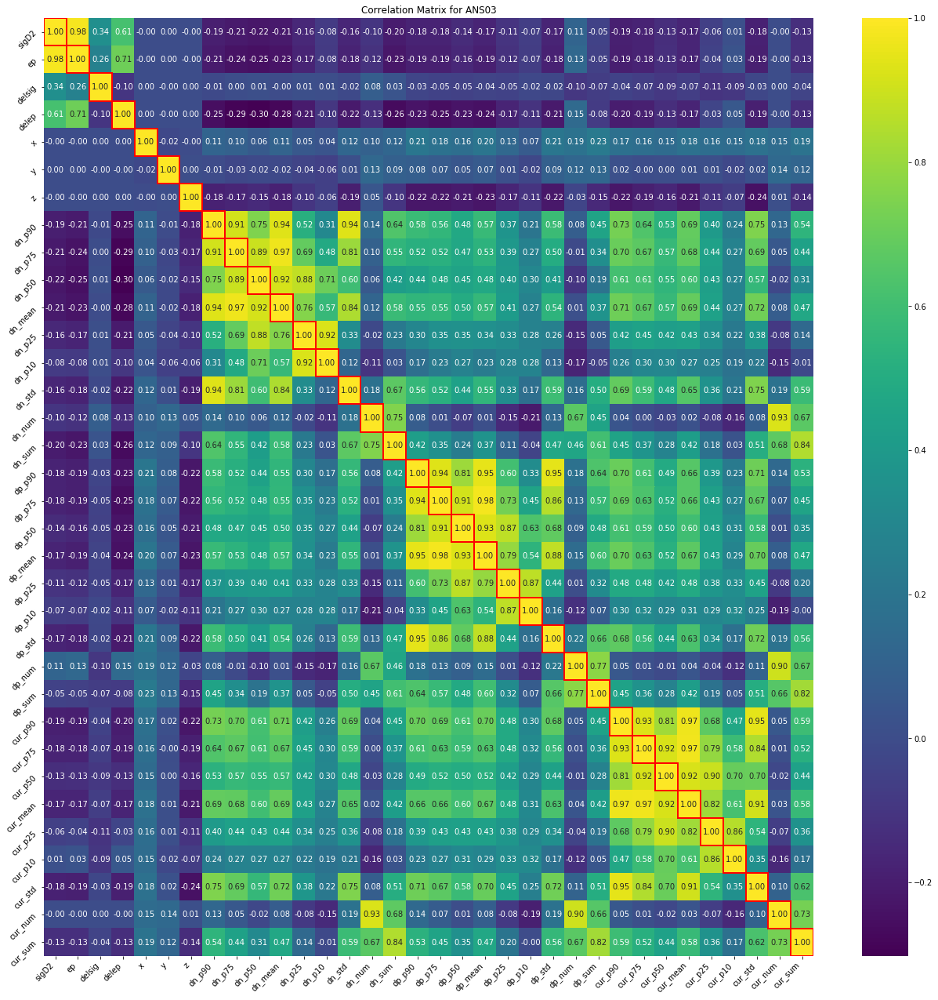

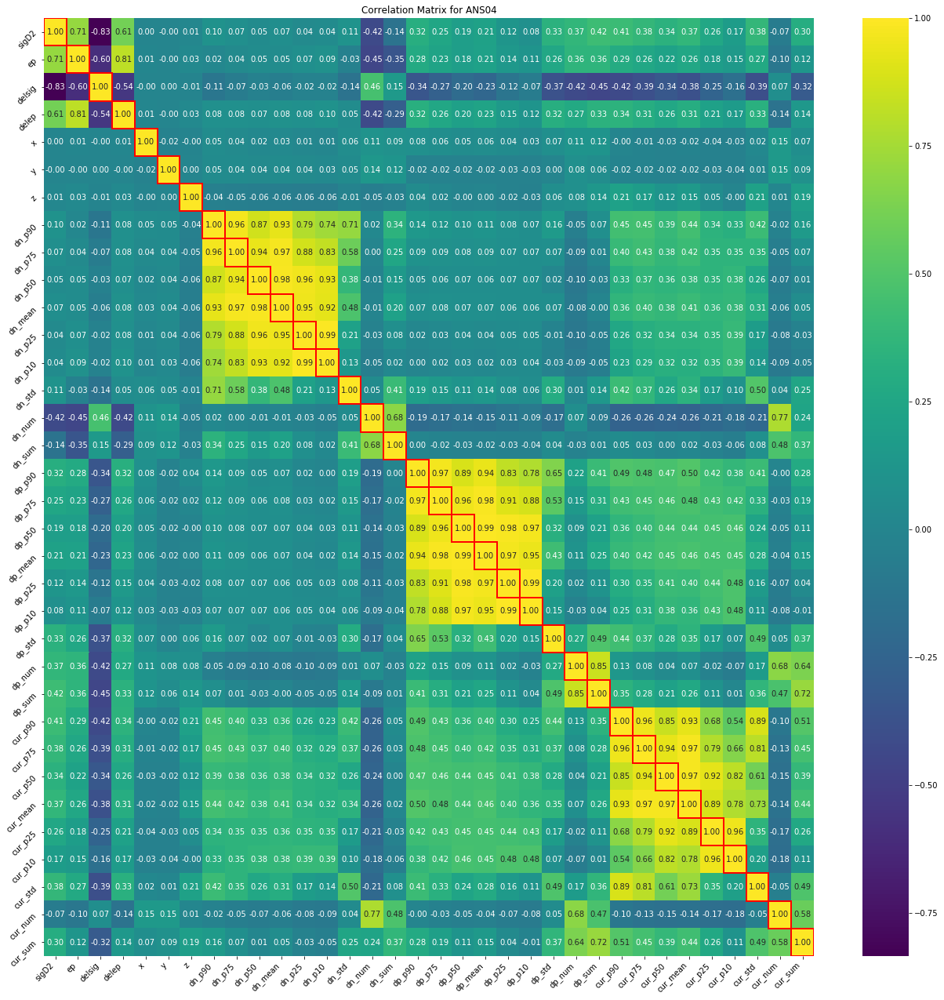

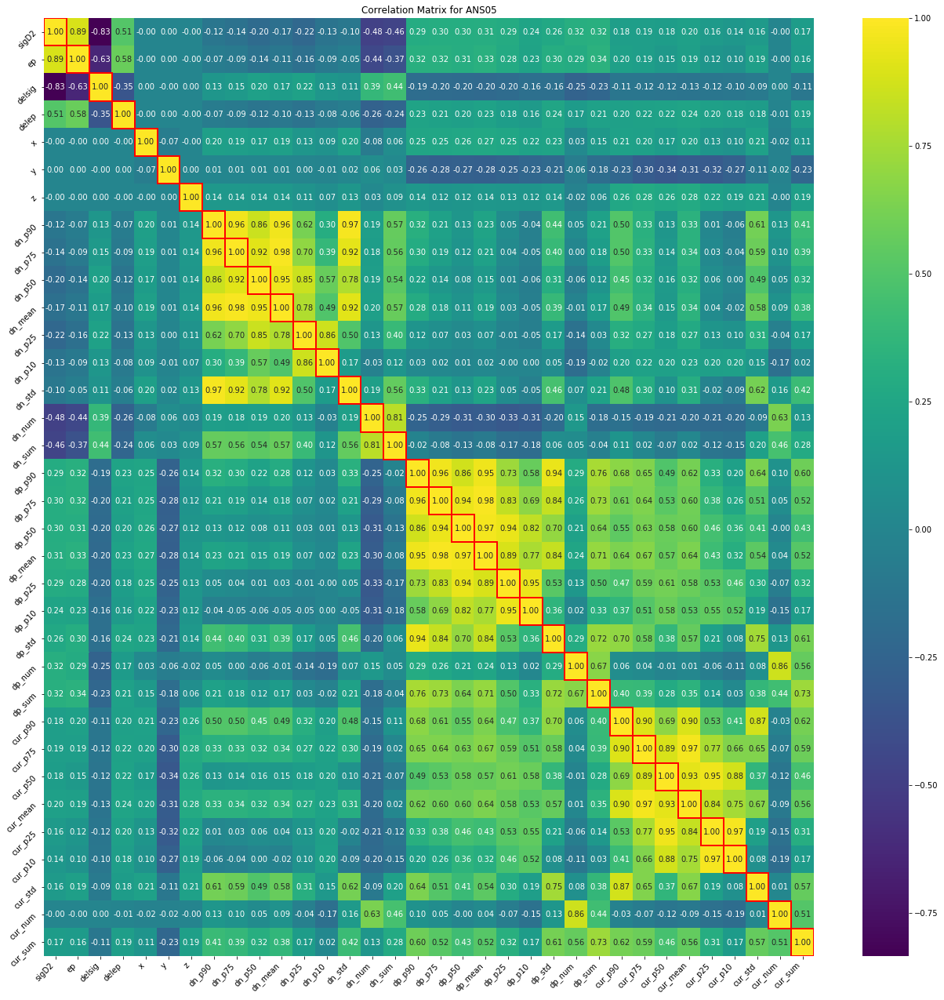

In [22]:
full_feature_list = ['sigD2','ep','delsig','delep','x','y','z']
full_feature_list.extend(features)
for i in range(num_exps):
    dataframe, timespan = get_experiment_data(folder, filenames[i], experiments[i], full_feature_list, target)
    correlation = dataframe.corr()
    plot_sns_score_matrix(correlation,full_feature_list,full_feature_list,["Correlation Matrix for "+experiments[i], "", ""],(22,22))

### Training the xgboost model
We can now start training our model. In this section we focus on training a single dataset xgboost model.


Training xgb models on 16 experiments, testing on same dataset. 
Storing models for later transfer learning:

Current experiment: strains_curr_FBL01_g50.txt, Completion: 6%


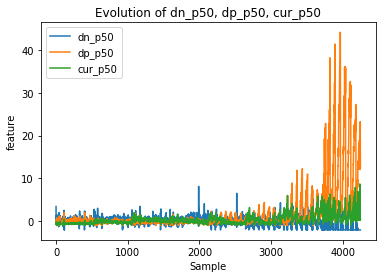

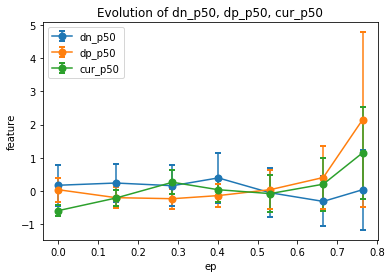

Train: [3398, 0.13692187035468142, 0.8033649544233312] 
Test: [850, 0.17589453207253145, 0.6942109082774076]


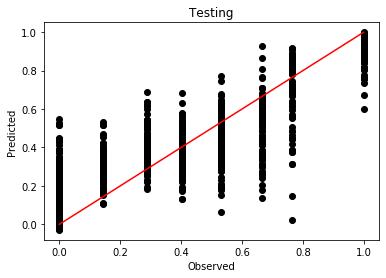

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


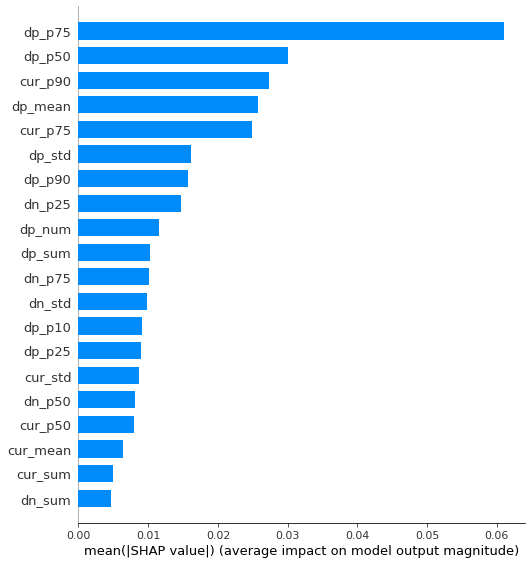

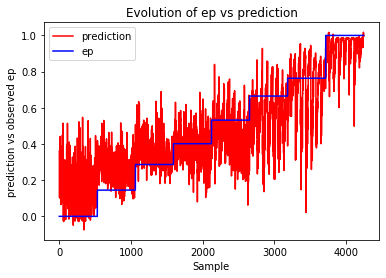

Current experiment: strains_curr_FBL02_g50.txt, Completion: 12%


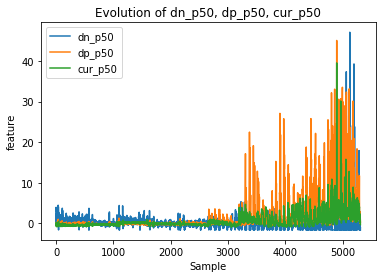

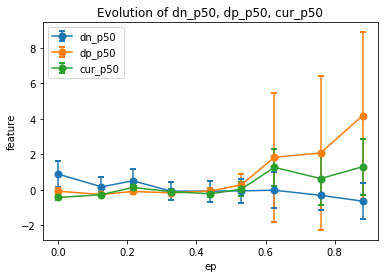

KeyboardInterrupt: 

In [22]:
print(f"\nTraining xgb models on {num_exps} experiments, testing on same dataset. \nStoring models for later transfer learning:\n")

for i in range(num_exps):
    
    print("Current experiment: %s, Completion: %d%%" %(filenames[i],(100*(i+1)/num_exps)))

    dataframe, timespan = get_experiment_data(folder, filenames[i], experiments[i], features, target)
    #dataframe = remove_outliers(dataframe, dataframe['ep'], ['dn_p50', 'dp_p50', 'cur_p50'], threshold = 0.99, verbose=True)
    
    df_train, df_test = train_test_split(dataframe, test_size=conf['model_details']['test_size'])

    plot_data_time_evolutions(dataframe, [features[2],features[11],features[20]], ['Evolution of '+features[2]+', '+features[11]+', '+features[20],'Sample','feature']) #This is a dumb way to do it: features[2] if we use the small featurelist
    plot_data_errorbars(dataframe, dataframe['ep'], [features[2],features[11],features[20]], ['Evolution of '+features[2]+', '+features[11]+', '+features[20],'ep','feature']) #This is a dumb way to do it: features[2] if we use the small featurelist

    train_time = time.time()
    model = train_xgb_model(df_train, target, features, conf) #other_model(df_train,target,features)
    models.append(model)
    train_time = time.time() - train_time
    
    with open(saved_models[i], 'wb') as file:
        pickle.dump(model,file)
    
    train_scores = test_regression_model(model,features,target,df_train)
    test_scores = test_regression_model(model,features,target,df_test)

    r2_train_vector[i] = train_scores[-1]
    r2_test_matrix[i,i] = test_scores[-1]

    print(f"Train: {train_scores}", f"\nTest: {test_scores}")

    plot_observed_vs_predicted(df_test, target, model, features, ['Testing','Observed','Predicted'])
    represent_model_results(model,df_train,features,target,train_scores)

    plot_feature_vs_prediction(dataframe, 'ep', model.predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])
    
    score_str+=(experiments[i]+" "+str(test_scores[1])+" "+str(test_scores[2]))+" "+str(train_time)+"\n"
    
    pred_vs_observed = np.column_stack((model.predict(dataframe[features]),dataframe['ep']))
    np.savetxt(result_folder+model_preds[i],pred_vs_observed)
    
#print(type(score_str))
#np.savetxt(result_folder+model_scores,score_str)
save_data_by_name(score_str,result_folder,model_scores)

### Transfer Learning
Now we can finally review the performance of the models we trained on the other datasets.


Performing tranfser learning, reprinting r2 scores 
and plotting score martix:

16 16
Train score on experiment FBL01: r2 = 0.8033649544233312
Test score: r2 = 0.6942109082774076
Train score on experiment FBL02: r2 = 0.8639332309757037
Test score: r2 = 0.8004424366900676
Train score on experiment ETNA01: r2 = 0.8502004385685078
Test score: r2 = 0.7440248132291682
Train score on experiment ETNA02: r2 = 0.8265381312653156
Test score: r2 = 0.7171842781770402
Train score on experiment MONZ03: r2 = 0.6330977324827318
Test score: r2 = 0.265830818072357
Train score on experiment MONZ04: r2 = 0.7776719714330077
Test score: r2 = 0.45212966318000714
Train score on experiment MONZ05: r2 = 0.7044461207371773
Test score: r2 = 0.5551104910122067
Train score on experiment WG01: r2 = 0.7409010455189159
Test score: r2 = 0.6263044307867727
Train score on experiment WG02: r2 = 0.7839499019348201
Test score: r2 = 0.5614977044612928
Train score on experiment WG04: r2 = 0.8054805354665763
Test score: r2 = 

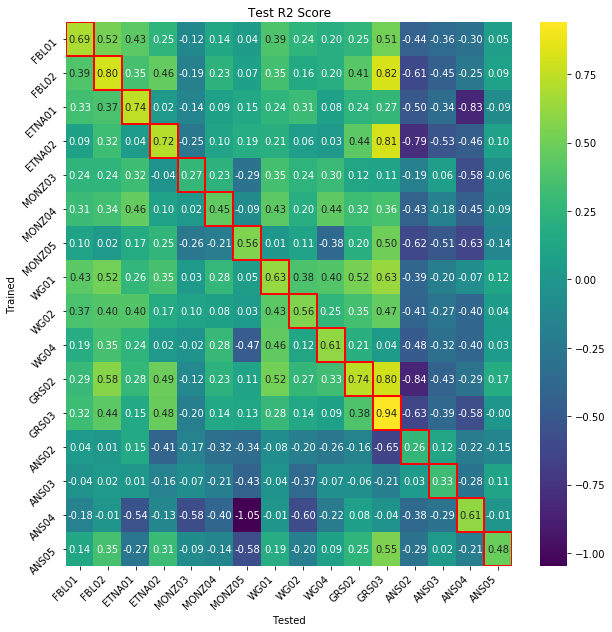

In [24]:
print("\nPerforming tranfser learning, reprinting r2 scores \nand plotting score martix:\n")

print(len(models),num_exps)
for i in range(len(models)):
    for j in range(num_exps):
        if j != i:
            dataframe, timespan = get_experiment_data(folder, filenames[j], experiments[j], features, target)
            scores = test_regression_model(models[i], features, target,dataframe)
            r2_test_matrix[i,j] = scores[-1]


    print(f"Train score on experiment {experiments[i]}: r2 = {r2_train_vector[i]}\nTest score: r2 = {r2_test_matrix[i,i]}")

plot_sns_score_matrix(r2_test_matrix,experiments,experiments,["Test R2 Score", "Tested", "Trained"])
np.savetxt(result_folder+model_score_matrix,r2_test_matrix)

### Combined Dataset Transfer Learning
When testing the models on different datasets generalization is important. With this in mind we investigate the possibility of the models being more generalizable when trained on multiple datasets.

#### Randomly selected datasets
First we train a model using randomly selected datasets.


Combining datasets to evaluate effect on model and performance

Datasets used for training: ['strains_curr_FBL01_g50.txt', 'strains_curr_MONZ04_g50.txt', 'strains_curr_GRS03_g50.txt']
Train: [10858, 0.13282235755757776, 0.8255201470892259] 
Test: [2715, 0.19407229272347723, 0.6419412011612047]


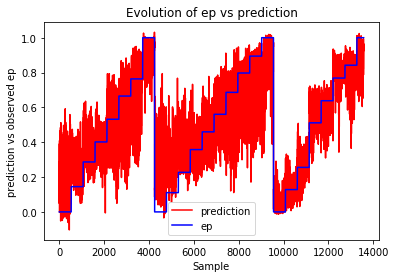


Datasets used for training: ['strains_curr_FBL02_g50.txt', 'strains_curr_ETNA02_g50.txt', 'strains_curr_GRS02_g50.txt']
Train: [11143, 0.1271320406770464, 0.841753164051138] 
Test: [2786, 0.16714397782474982, 0.7233717433801483]


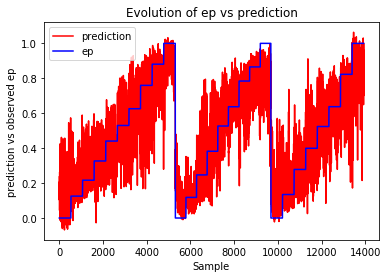


Datasets used for training: ['strains_curr_ETNA01_g50.txt', 'strains_curr_MONZ05_g50.txt', 'strains_curr_WG02_g50.txt']
Train: [12150, 0.1447755797390716, 0.7806504906137399] 
Test: [3038, 0.1939130088289049, 0.5930295271564892]


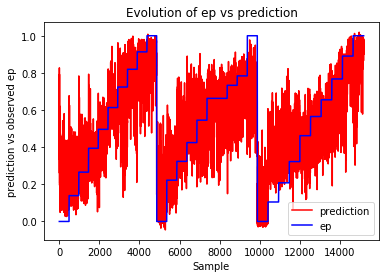


Datasets used for training: ['strains_curr_MONZ03_g50.txt', 'strains_curr_WG01_g50.txt', 'strains_curr_WG04_g50.txt']
Train: [12586, 0.16544018669115973, 0.7392242057649544] 
Test: [3147, 0.23336363629207257, 0.4844245312161545]


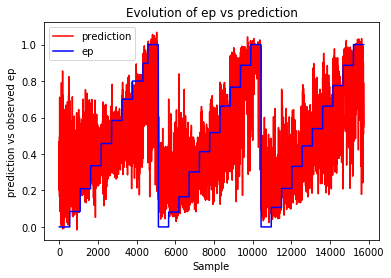

In [25]:
print("\nCombining datasets to evaluate effect on model and performance")
filelist = [ [ filenames[0], filenames[5], filenames[11] ] , [ filenames[1], filenames[3], filenames[10] ], [ filenames[2], filenames[6], filenames[8] ], [ filenames[4], filenames[7], filenames[9] ] ] #THIS IS INEFFICIENT, BUT SUFFICIENT FOR TESTING
experimentlist = [ [ experiments[0], experiments[5], experiments[11] ] , [ experiments[1], experiments[3], experiments[10] ], [ experiments[2], experiments[6], experiments[8] ], [ experiments[4], experiments[7], experiments[9] ] ]
num_train_sets = len(filelist)

#fbl-etna
#monz-wg
#grs-ans

multi_models = []

r2_multi_test_matrix = np.zeros((num_train_sets,num_exps))

for i in range(num_train_sets):
    print(f"\nDatasets used for training: {filelist[i]}")
    dataframe, timespan = get_experiment_data(folder, filelist[i], experiments, features, target)

    df_train, df_test = train_test_split(dataframe, test_size=conf['model_details']['test_size'])

    multi_model = train_xgb_model(df_train, target, features, conf) #other_model(df_train,target,features)
    multi_models.append(multi_model)

    train_scores = test_regression_model(multi_model,features,target,df_train)
    test_scores = test_regression_model(multi_model,features,target,df_test)

    print(f"Train: {train_scores}", f"\nTest: {test_scores}")

    plot_feature_vs_prediction(dataframe, 'ep', multi_model.predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])
    
    for j in range(num_exps):
        dataframe, timespan = get_experiment_data(folder, filenames[j], experiments[j], features, target)
        scores = test_regression_model(multi_models[i], features, target,dataframe)
        r2_multi_test_matrix[i,j] = scores[-1]

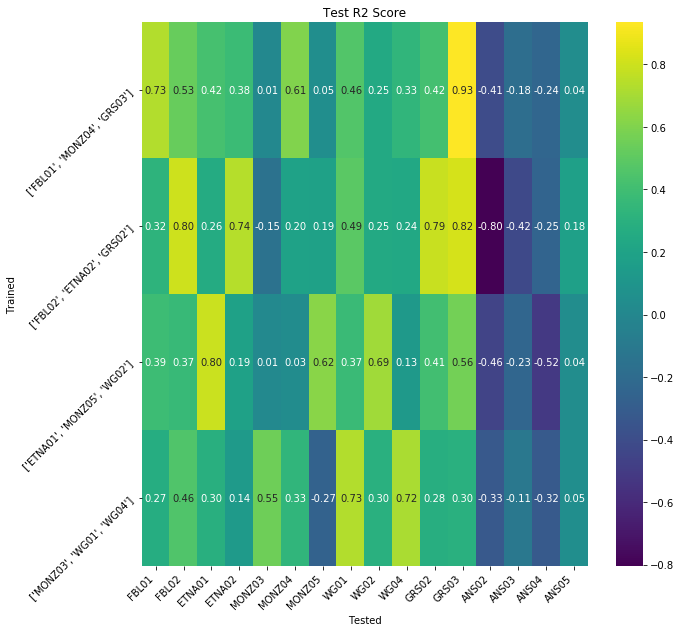

In [26]:
plot_sns_score_matrix(r2_multi_test_matrix,experimentlist,experiments,["Test R2 Score", "Tested", "Trained"], diagonal=False)

When observing the models generated by a random selection of multiple datasets we see what looks to be a large amount of variance in the model prediction. A possible hypothesis is that some of the features within the datasets are less compatible. This motivates the use of datasets with better compatibility. In the next section we will instead be reviewing performance on preselected datasets. 

### The test using preselected datasets
The sets are chosen with the knowlege that fbl-etna, monz-wg and grs-ans fit well together.


Combining datasets to evaluate effect on model and performance

Datasets used for training: ['strains_curr_FBL01_g50.txt', 'strains_curr_FBL02_g50.txt']
Train: [7644, 0.12823501438376605, 0.8319956635483947] 
Test: [1911, 0.16314401571624454, 0.724127934567431]


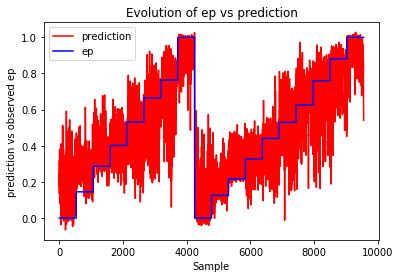


Datasets used for training: ['strains_curr_FBL01_g50.txt', 'strains_curr_ETNA01_g50.txt']
Train: [7284, 0.12711300614254697, 0.8383775115069614] 
Test: [1822, 0.16775966070092205, 0.7238074976544311]


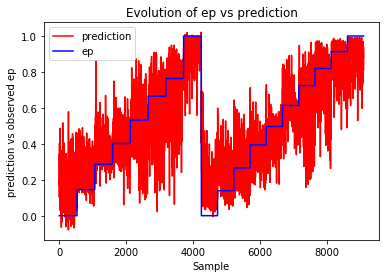


Datasets used for training: ['strains_curr_MONZ04_g50.txt', 'strains_curr_MONZ05_g50.txt']
Train: [8260, 0.15455429622086694, 0.740027167277963] 
Test: [2065, 0.2250422905620112, 0.4350061761320555]


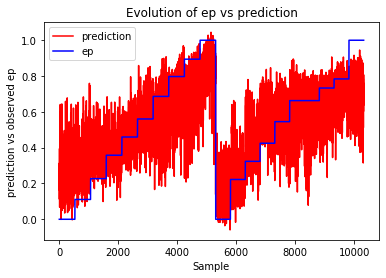


Datasets used for training: ['strains_curr_MONZ04_g50.txt', 'strains_curr_WG01_g50.txt']
Train: [8488, 0.15034457520076389, 0.7866499522296853] 
Test: [2123, 0.22004397803002473, 0.5336811537930473]


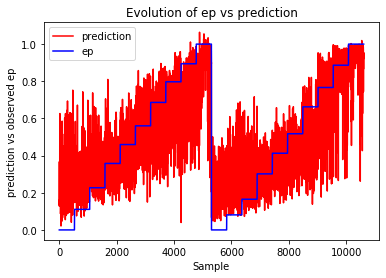


Datasets used for training: ['strains_curr_GRS02_g50.txt', 'strains_curr_GRS03_g50.txt']
Train: [6616, 0.10052276218822702, 0.9027858076402828] 
Test: [1654, 0.13143023249866537, 0.8298548410656972]


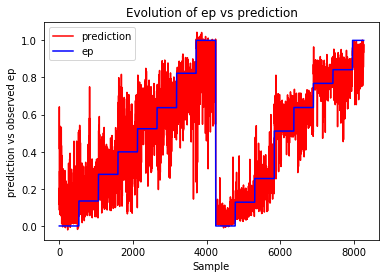


Datasets used for training: ['strains_curr_GRS03_g50.txt', 'strains_curr_ANS04_g50.txt']
Train: [12052, 0.12224134310228822, 0.8521060154716542] 
Test: [3013, 0.16603274138776933, 0.7267710007188874]


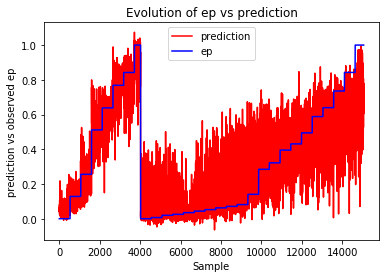


Datasets used for training: ['strains_curr_GRS03_g50.txt', 'strains_curr_ANS02_g50.txt']
Train: [7462, 0.14013256723825454, 0.8032888485950134] 
Test: [1866, 0.20033876308777895, 0.574172703880935]


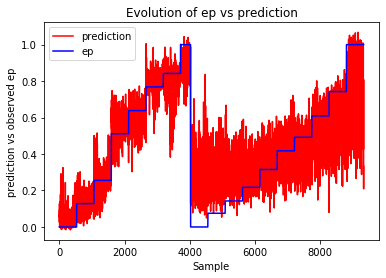


Datasets used for training: ['strains_curr_GRS03_g50.txt', 'strains_curr_ANS03_g50.txt']
Train: [7034, 0.14344218001560427, 0.7979989392548863] 
Test: [1759, 0.20313070045460574, 0.5887704162635409]


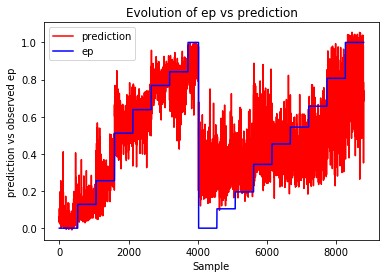


Datasets used for training: ['strains_curr_GRS02_g50.txt', 'strains_curr_GRS03_g50.txt', 'strains_curr_ANS03_g50.txt', 'strains_curr_ANS04_g50.txt']
Train: [19267, 0.15515133261356226, 0.7687149154819022] 
Test: [4817, 0.2021184627586699, 0.6025543096867423]


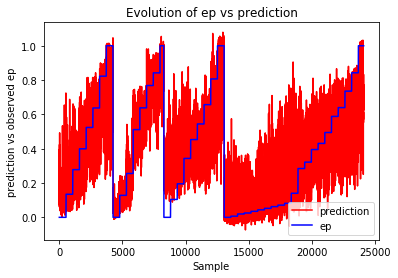

In [27]:
print("\nCombining datasets to evaluate effect on model and performance")
#['FBL01', 'FBL02', 'ETNA01', 'ETNA02', 'MONZ03', 'MONZ04', 'MONZ05', 'WG01', 'WG02', 'WG04', 'GRS02', 'GRS03', 'ANS02', 'ANS03', 'ANS04', 'ANS05']
filelist = [ [ filenames[0], filenames[1] ] , [ filenames[0], filenames[2] ], [ filenames[5], filenames[6] ], [ filenames[5], filenames[7] ], [ filenames[10], filenames[11] ], [ filenames[11], filenames[14] ], [ filenames[11], filenames[12] ], [ filenames[11], filenames[13] ], [ filenames[10], filenames[11], filenames[13], filenames[14] ] ] #THIS IS INEFFICIENT, BUT SUFFICIENT FOR TESTING
experimentlist = [ [ experiments[0], experiments[1] ] , [ experiments[0], experiments[2] ], [ experiments[5], experiments[6] ], [ experiments[5], experiments[7] ], [ experiments[10], experiments[11] ], [ experiments[11], experiments[14] ], [ experiments[11], experiments[12] ], [ experiments[11], experiments[13] ], [ experiments[10], experiments[11], experiments[13], experiments[14] ] ]
num_train_sets = len(filelist)

saved_multi_models = ['../stored_models/model_xgb_'+''.join(experiments)+'_g'+rad+'0.pkl' for experiments in experimentlist] #filenames for saved models using pickle
multi_model_score_matrix = 'multi_dataset_transfer_learning_score_matrix_xgb_g'+rad+'0.txt'

#fbl-etna
#monz-wg
#grs-ans

multi_models = []

r2_multi_test_matrix = np.zeros((num_train_sets,num_exps))

for i in range(num_train_sets):
    print(f"\nDatasets used for training: {filelist[i]}")
    dataframe, timespan = get_experiment_data(folder, filelist[i], experiments, features, target)

    df_train, df_test = train_test_split(dataframe, test_size=conf['model_details']['test_size'])

    multi_model = train_xgb_model(df_train, target, features, conf) #other_model(df_train,target,features)
    multi_models.append(multi_model)
    
    with open(saved_multi_models[i], 'wb') as file:
        pickle.dump(model,file)

    train_scores = test_regression_model(multi_model,features,target,df_train)
    test_scores = test_regression_model(multi_model,features,target,df_test)

    print(f"Train: {train_scores}", f"\nTest: {test_scores}")

    plot_feature_vs_prediction(dataframe, 'ep', multi_model.predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])
    
    for j in range(num_exps):
        dataframe, timespan = get_experiment_data(folder, filenames[j], experiments[j], features, target)
        scores = test_regression_model(multi_models[i], features, target,dataframe)
        r2_multi_test_matrix[i,j] = scores[-1]

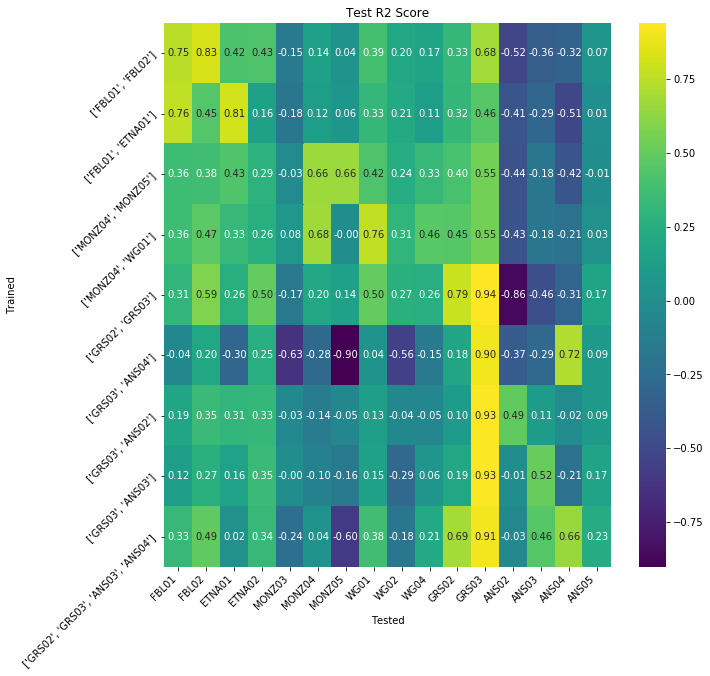

In [28]:
plot_sns_score_matrix(r2_multi_test_matrix,experimentlist,experiments,["Test R2 Score", "Tested", "Trained"], diagonal=False)
np.savetxt(result_folder+multi_model_score_matrix,r2_multi_test_matrix)

Interestingly we observe the performance of the ANS datasets improve compared to when only trained on itself. A possible initial hypothesis is that the dataset is noisy and need another dataset to make a generalizable model. Similarly the FBL datasets improve test performance above the single dataset models. The expected perfomance increase on datasets not yet seen by the model is however not as prominent (even if it is slight on some sets).

### Training a SVM model


Training svm models on 16 experiments, testing on same dataset. 
Storing models for later transfer learning:

Current experiment: strains_curr_FBL01_g50.txt, Completion: 6%
Train: [3398, 0.1029966738958678, 0.8896273956224904] 
Test: [850, 0.23201125369237674, 0.45496162569839926]


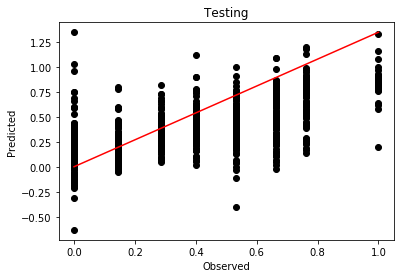

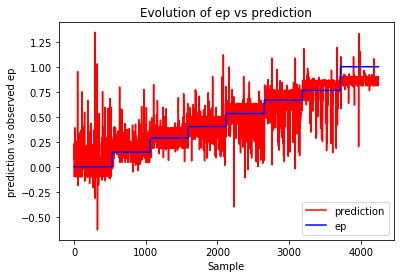

Current experiment: strains_curr_FBL02_g50.txt, Completion: 12%
Train: [4245, 0.09990687158506431, 0.8993555892033336] 
Test: [1062, 0.17971283775800614, 0.6565559973189574]


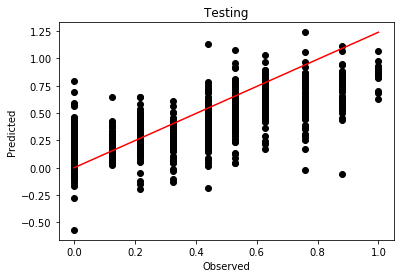

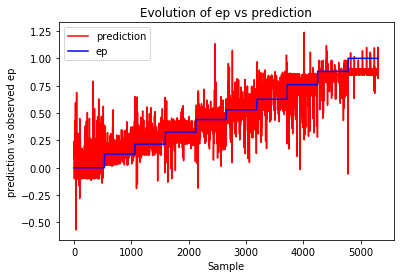

Current experiment: strains_curr_ETNA01_g50.txt, Completion: 18%
Train: [3886, 0.11515718252834607, 0.8686912354942711] 
Test: [972, 0.20681372959213512, 0.5939256293647052]


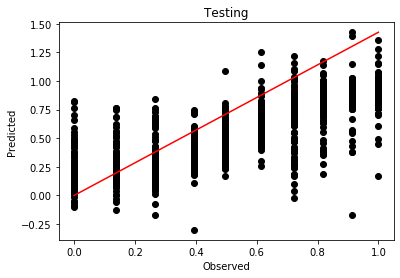

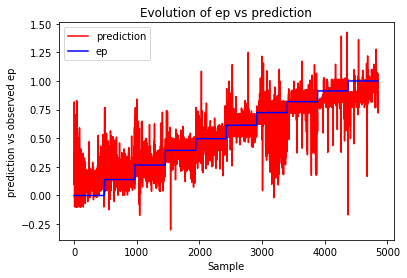

Current experiment: strains_curr_ETNA02_g50.txt, Completion: 25%
Train: [3499, 0.11457166985466362, 0.8758470036414672] 
Test: [875, 0.21838785694199542, 0.5611241777778591]


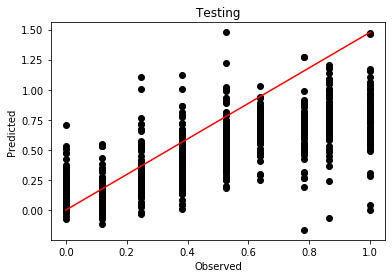

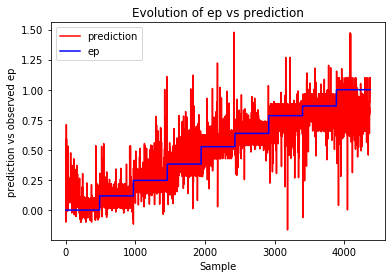

Current experiment: strains_curr_MONZ03_g50.txt, Completion: 31%
Train: [4094, 0.14189047470764277, 0.807590462547762] 
Test: [1024, 0.3342526937004576, -0.0439417253266452]


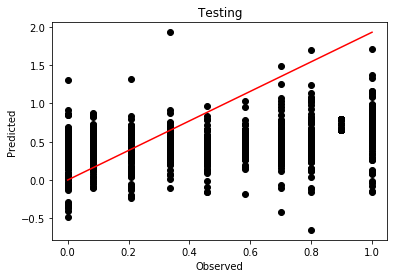

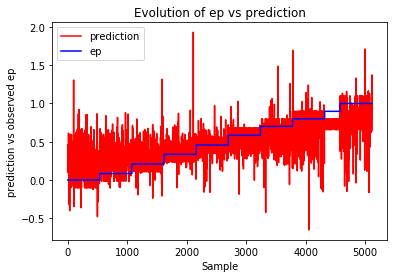

Current experiment: strains_curr_MONZ04_g50.txt, Completion: 37%
Train: [4242, 0.13452572630264323, 0.8273620163256415] 
Test: [1061, 0.29167144152863506, 0.10429165435508803]


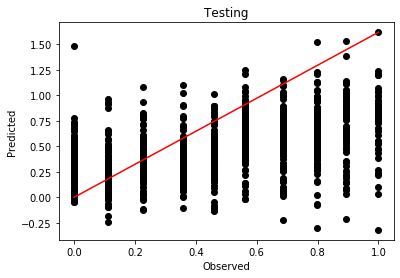

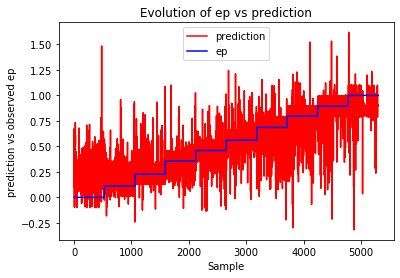

Current experiment: strains_curr_MONZ05_g50.txt, Completion: 43%
Train: [4017, 0.11319673955876296, 0.8377021345159521] 
Test: [1005, 0.22243606420754983, 0.3754437938216847]


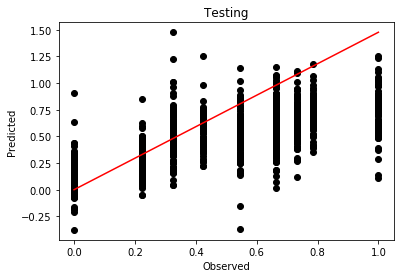

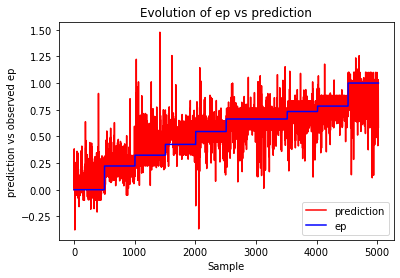

Current experiment: strains_curr_WG01_g50.txt, Completion: 50%
Train: [4246, 0.11884614109390093, 0.8684274668575029] 
Test: [1062, 0.2563917008702935, 0.39884426518611105]


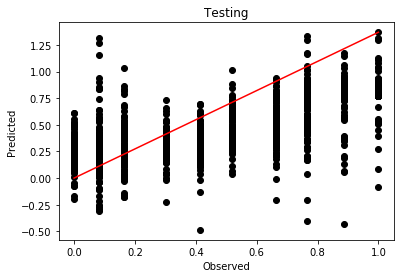

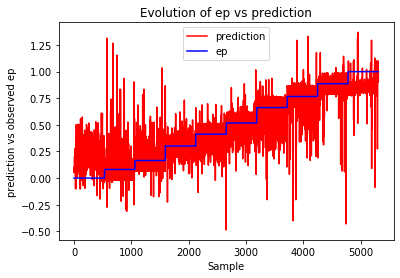

Current experiment: strains_curr_WG02_g50.txt, Completion: 56%
Train: [4246, 0.11193358163702771, 0.8784179990580654] 
Test: [1062, 0.2632904513236522, 0.31363965631109136]


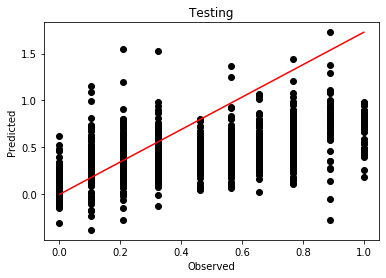

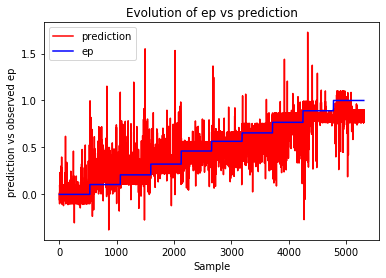

Current experiment: strains_curr_WG04_g50.txt, Completion: 62%
Train: [4245, 0.12363180336746177, 0.8516540967884552] 
Test: [1062, 0.2621216322954852, 0.3074676827777386]


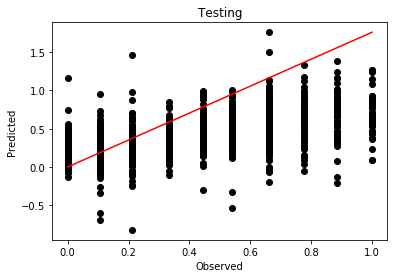

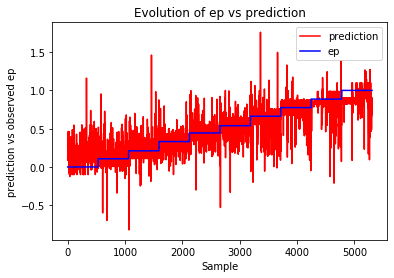

Current experiment: strains_curr_GRS02_g50.txt, Completion: 68%
Train: [3398, 0.08586618117692707, 0.927464655937786] 
Test: [850, 0.20635161412045858, 0.5764139710235952]


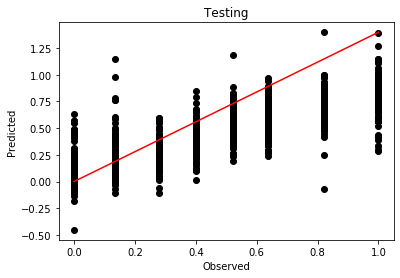

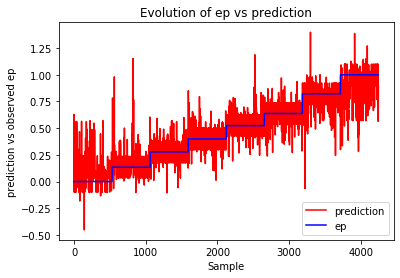

Current experiment: strains_curr_GRS03_g50.txt, Completion: 75%
Train: [3217, 0.07033216655316964, 0.9536831759829169] 
Test: [805, 0.09439364954663498, 0.9104103591964722]


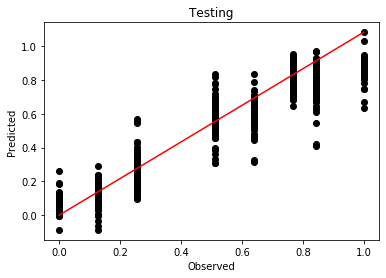

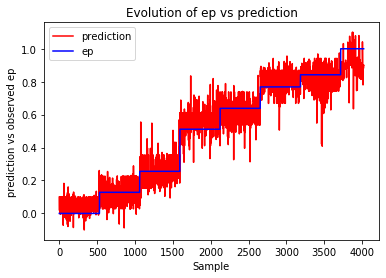

Current experiment: strains_curr_ANS02_g50.txt, Completion: 81%
Train: [4244, 0.12713244754949884, 0.8199851923423426] 
Test: [1062, 0.3257264086550707, -0.15964137206908546]


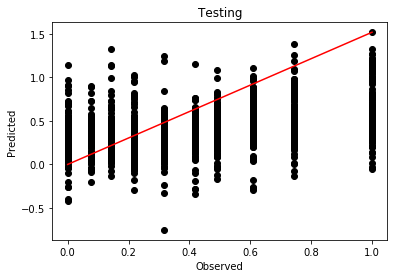

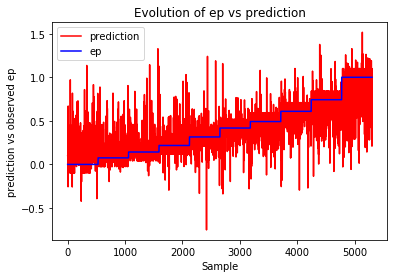

Current experiment: strains_curr_ANS03_g50.txt, Completion: 87%
Train: [3816, 0.1132896959483108, 0.8713031176112715] 
Test: [955, 0.32565717349287826, -0.18467054395846705]


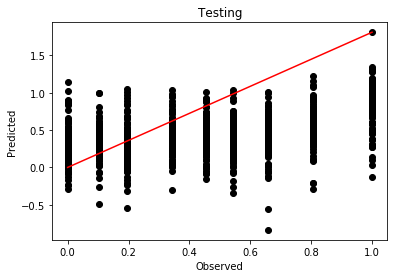

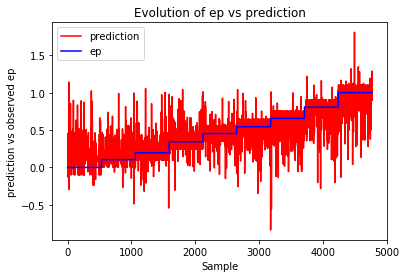

Current experiment: strains_curr_ANS04_g50.txt, Completion: 93%
Train: [8834, 0.11029407088174456, 0.8615868661278432] 
Test: [2209, 0.22796536666677383, 0.43742351692705084]


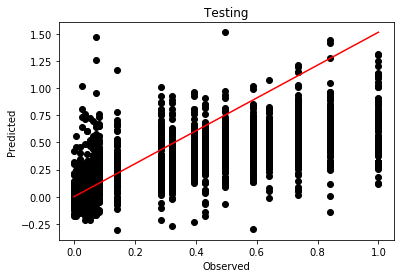

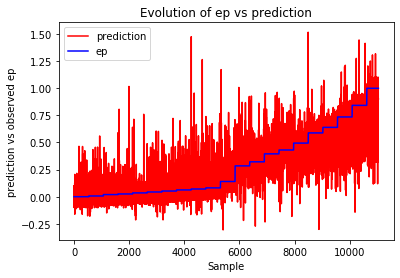

Current experiment: strains_curr_ANS05_g50.txt, Completion: 100%
Train: [3340, 0.12588615624595173, 0.8664505074565079] 
Test: [835, 0.3283299360297614, 0.11515951944664105]


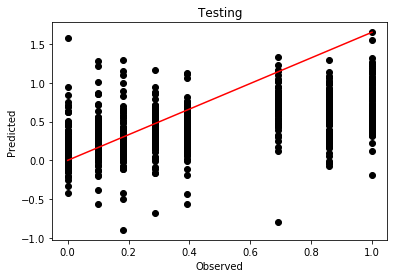

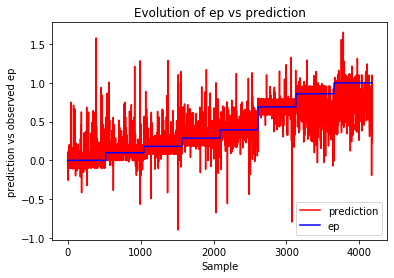

In [27]:
print(f"\nTraining svm models on {num_exps} experiments, testing on same dataset. \nStoring models for later transfer learning:\n")

svm_model_scores = 'model_scores_svm_g'+rad+'0.txt'
score_str = "experiment r2 mse time\n"
models = []

for i in range(num_exps):

    print("Current experiment: %s, Completion: %d%%" %(filenames[i],(100*(i+1)/num_exps)))

    dataframe, timespan = get_experiment_data(folder, filenames[i], experiments[i], features, target)
    df_train, df_test = train_test_split(dataframe, test_size=conf['model_details']['test_size'])

    train_time = time.time()
    model = train_svm_model(df_train, target, features) #other_model(df_train,target,features)
    models.append(model)
    train_time = time.time() - train_time
    
    train_scores = test_regression_model(model,features,target,df_train)
    test_scores = test_regression_model(model,features,target,df_test)

    r2_train_vector[i] = train_scores[-1]
    r2_test_matrix[i,i] = test_scores[-1]

    print(f"Train: {train_scores}", f"\nTest: {test_scores}")

    plot_observed_vs_predicted(df_test, target, model, features, ['Testing','Observed','Predicted'])

    plot_feature_vs_prediction(dataframe, 'ep', model.predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])
    
    score_str+=(experiments[i]+" "+str(test_scores[1])+" "+str(test_scores[2]))+" "+str(train_time)+"\n"
    
save_data_by_name(score_str,result_folder,svm_model_scores)


Performing tranfser learning, reprinting r2 scores 
and plotting score martix:

Train score on experiment FBL01: r2 = 0.8868858450174435
Test score: r2 = 0.3654863348553561
Train score on experiment FBL02: r2 = 0.8981181390822046
Test score: r2 = 0.6469987541003692
Train score on experiment ETNA01: r2 = 0.8687812263896749
Test score: r2 = 0.594380520245021
Train score on experiment ETNA02: r2 = 0.8781383526494709
Test score: r2 = 0.5546502152563291
Train score on experiment MONZ03: r2 = 0.8166939898873035
Test score: r2 = -0.052836047451602974
Train score on experiment MONZ04: r2 = 0.8248971558905589
Test score: r2 = 0.2232674761994755
Train score on experiment MONZ05: r2 = 0.839618419738648
Test score: r2 = 0.3045587440856088
Train score on experiment WG01: r2 = 0.8667119350681075
Test score: r2 = 0.42066414742424163
Train score on experiment WG02: r2 = 0.8803435042185116
Test score: r2 = 0.22378656136388952
Train score on experiment WG04: r2 = 0.8563001773114776
Test score: r2 = 0.3

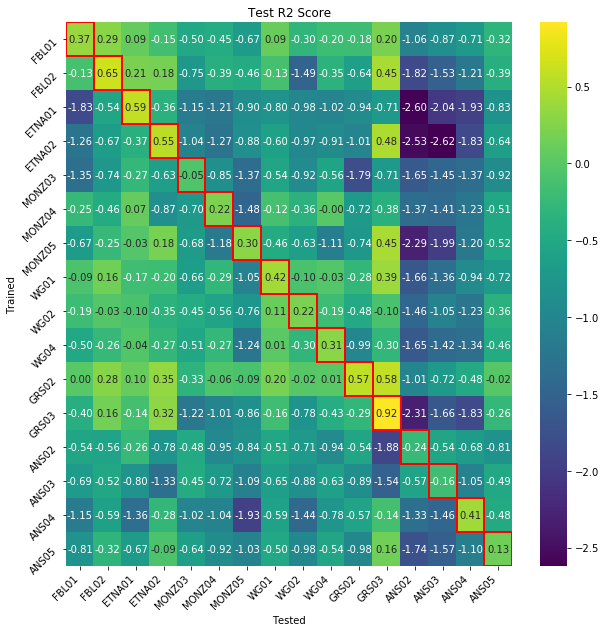

In [30]:
print("\nPerforming tranfser learning, reprinting r2 scores \nand plotting score martix:\n")
for i in range(len(models)):
    for j in range(num_exps):
        if j != i:
            dataframe, timespan = get_experiment_data(folder, filenames[j], experiments[j], features, target)
            scores = test_regression_model(models[i], features, target,dataframe)
            r2_test_matrix[i,j] = scores[-1]


    print(f"Train score on experiment {experiments[i]}: r2 = {r2_train_vector[i]}\nTest score: r2 = {r2_test_matrix[i,i]}")

plot_sns_score_matrix(r2_test_matrix,experiments,experiments,["Test R2 Score", "Tested", "Trained"])


The support vector machines performes fairly well on some of the datasets. However that is testing on the same dataset, when it comes to transfer learning our results seem to be far worse than xgboost. In addition xgboost seems to have a more consistent performance on the different datasets.

### Datasets with a higher resolution

In [31]:
folder = '../strain_data_MS/' #rename experiment_folder -> add result_folder
experiments = ['FBL01', 'FBL02', 'ETNA01', 'ETNA02', 'MONZ04', 'MONZ05', 'WG01', 'WG02', 'WG04', 'GRS02', 'GRS03', 'ANS02', 'ANS03', 'ANS04', 'ANS05']
num_exps = len(experiments)
#features = ['dp_p90', 'dp_p75', 'dp_p50', 'dp_mean', 'dp_p25', 'dp_p10', 'dp_std', 'dp_num', 'dp_sum']
features = ['dn_p90', 'dn_p75', 'dn_p50', 'dn_mean', 'dn_p25', 'dn_p10', 'dn_std', 'dn_num', 'dn_sum', 'dp_p90', 'dp_p75', 'dp_p50', 'dp_mean', 'dp_p25', 'dp_p10', 'dp_std', 'dp_num', 'dp_sum', 'cur_p90', 'cur_p75', 'cur_p50', 'cur_mean', 'cur_p25', 'cur_p10', 'cur_std', 'cur_num', 'cur_sum']
rad = '2' #Experiment resolutions 5 and 2
filenames = ['strains_curr_'+experiment+'_g'+rad+'0.txt' for experiment in experiments]
target = "ep" #"sigD2" #save as strain if ep, stress elif sigD2, else dont save

conf = config()

result_folder = '../strain_model_output_MS/'
model_scores = 'model_scores_xgb_g'+rad+'0.txt'
score_str = "experiment r2 mse time\n"
model_score_matrix = 'transfer_learning_score_matrix_xgb_g'+rad+'0.txt'
model_preds = ['result_xgb_'+experiment+'_g'+rad+'0.txt' for experiment in experiments] #filenames for saved data
saved_models = ['../stored_models/model_xgb_'+experiment+'_g'+rad+'0.pkl' for experiment in experiments] #filenames for saved models using pickle

nn_model_scores = 'model_scores_dnn_g'+rad+'0.txt'
nn_model_score_matrix = 'transfer_learning_score_matrix_dnn_g'+rad+'0.txt'
nn_model_preds = ['result_dnn_'+experiment+'_g'+rad+'0.txt' for experiment in experiments] #filenames for saved data
nn_saved_models = ['../stored_models/model_dnn_'+experiment+'_g'+rad+'0.pkl' for experiment in experiments] #filenames for saved models using pickle


models = []
r2_train_vector = np.zeros(num_exps)
r2_test_matrix = np.zeros((num_exps,num_exps))


Training xgb models on 15 experiments, testing on same dataset. 
Storing models for later transfer learning:

Current experiment: strains_curr_FBL01_g20.txt, Completion: 6%


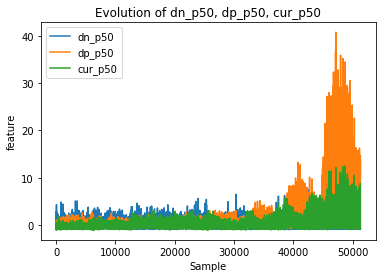

Train: [41017, 0.20029998373208824, 0.5857134007054474] 
Test: [10255, 0.20596070300154262, 0.55946300712331]


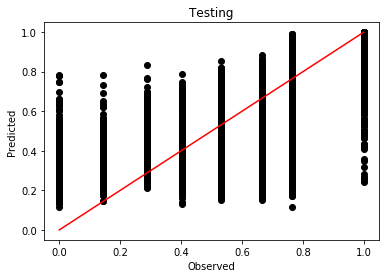

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


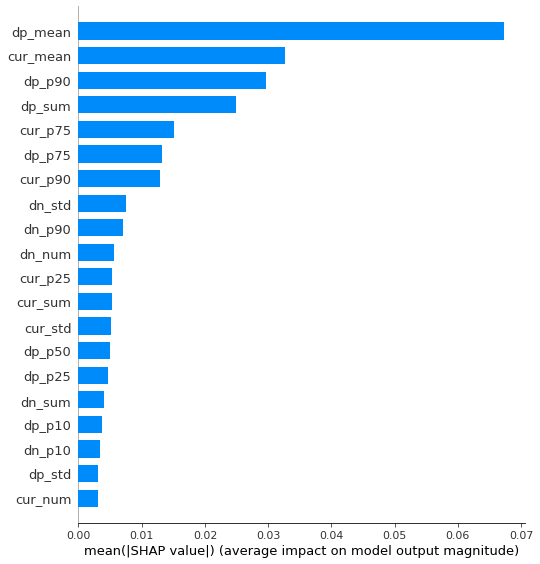

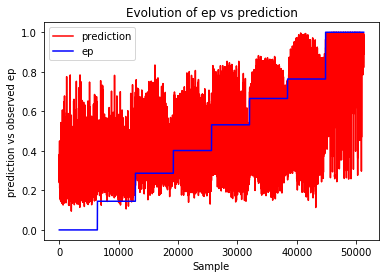

Current experiment: strains_curr_FBL02_g20.txt, Completion: 13%


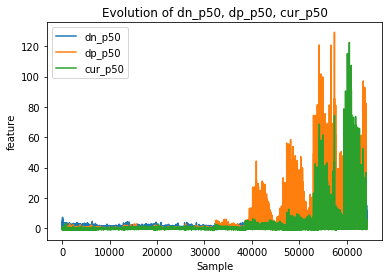

Train: [51418, 0.1803008317647803, 0.6695953226221103] 
Test: [12855, 0.1926557739537547, 0.6177496985505229]


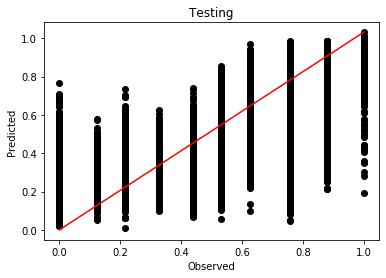

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


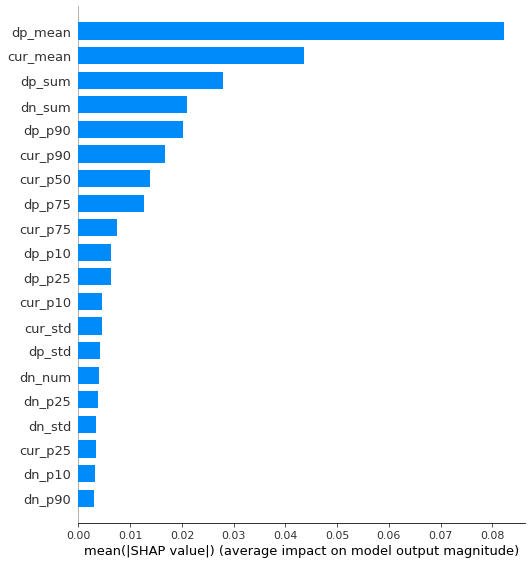

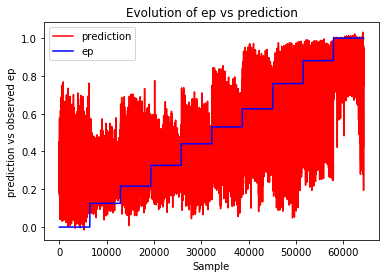

Current experiment: strains_curr_ETNA01_g20.txt, Completion: 20%


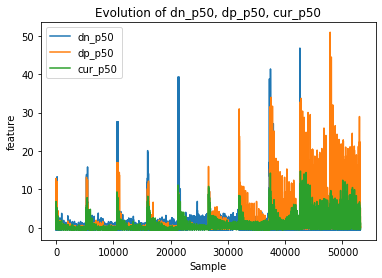

Train: [42516, 0.1614535610888187, 0.7434955935119713] 
Test: [10630, 0.1843263244547921, 0.6682270408060859]


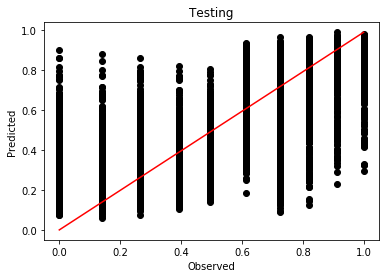

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


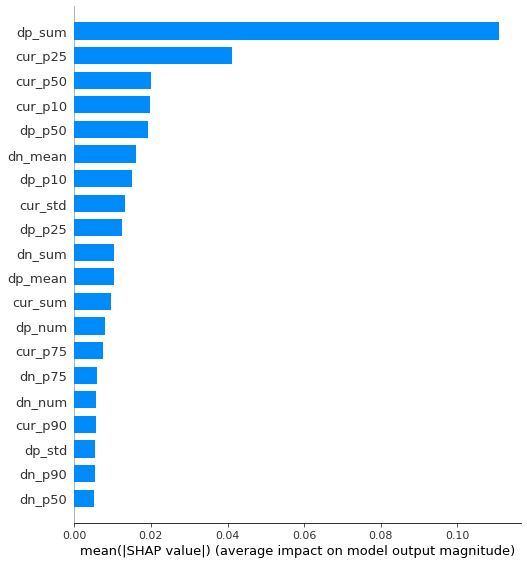

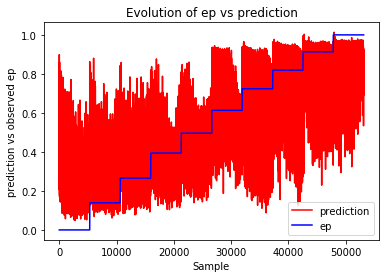

Current experiment: strains_curr_ETNA02_g20.txt, Completion: 26%


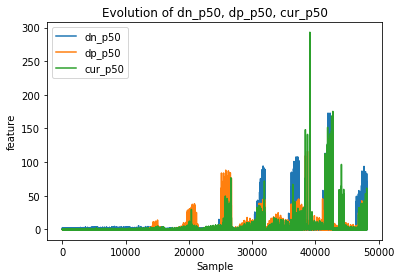

Train: [38492, 0.16995560726808756, 0.728544553666626] 
Test: [9624, 0.19580282634944393, 0.6394587900941676]


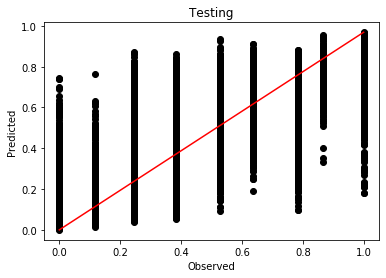

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


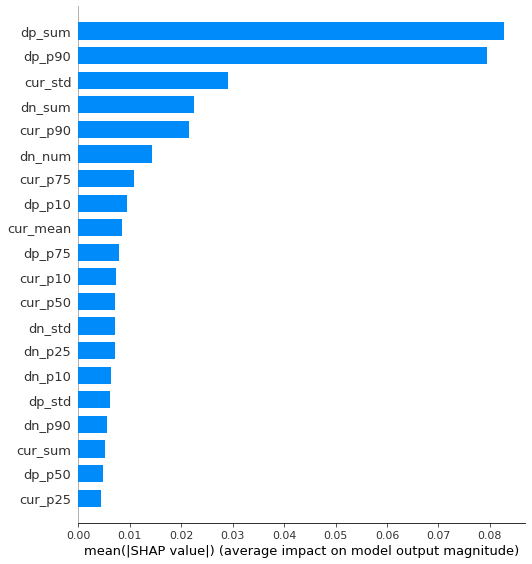

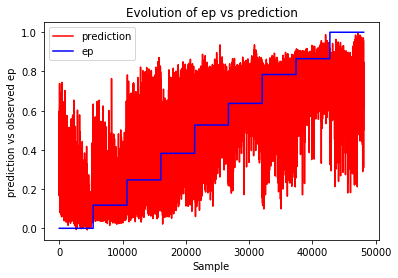

Current experiment: strains_curr_MONZ04_g20.txt, Completion: 33%


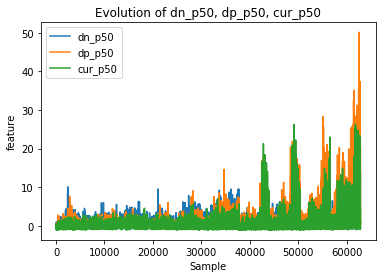

Train: [50284, 0.24891335917306803, 0.3979086814203354] 
Test: [12572, 0.26674952469228536, 0.30793721013697595]


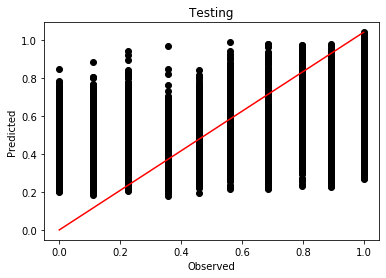

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


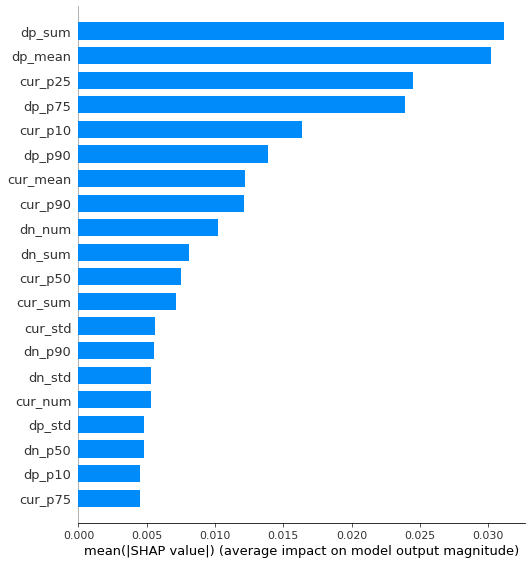

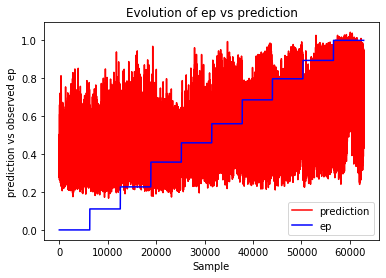

Current experiment: strains_curr_MONZ05_g20.txt, Completion: 40%


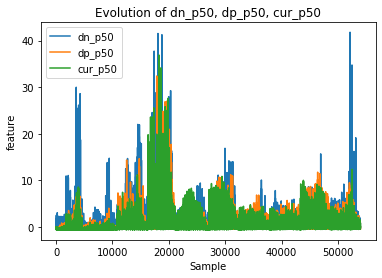

Train: [43196, 0.1987740777137141, 0.4977427883833023] 
Test: [10799, 0.2152627914667535, 0.4132494812913221]


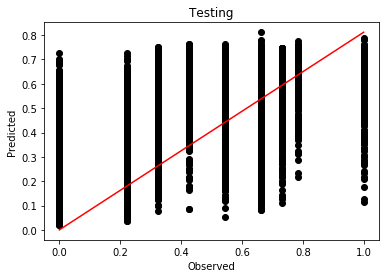

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


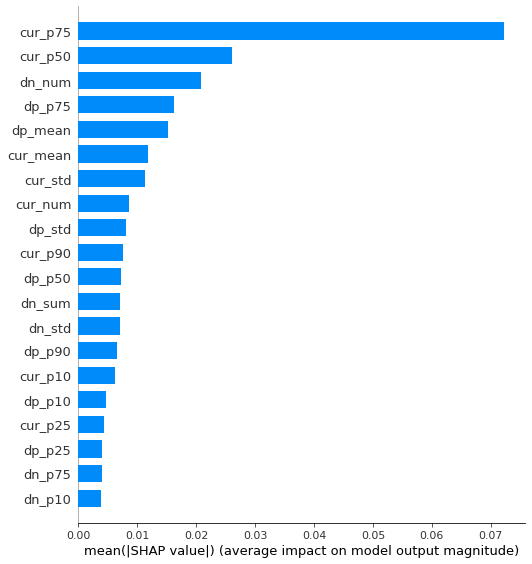

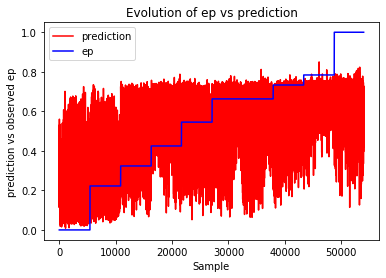

Current experiment: strains_curr_WG01_g20.txt, Completion: 46%


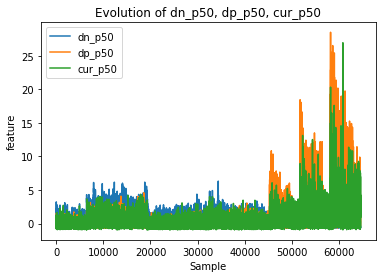

Train: [51642, 0.23327326306105223, 0.49445046516454294] 
Test: [12911, 0.23991063195135992, 0.46504651429576127]


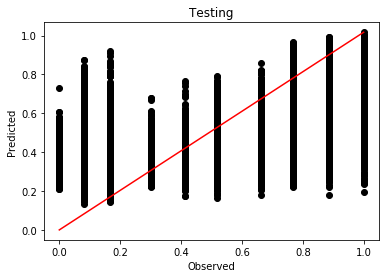

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


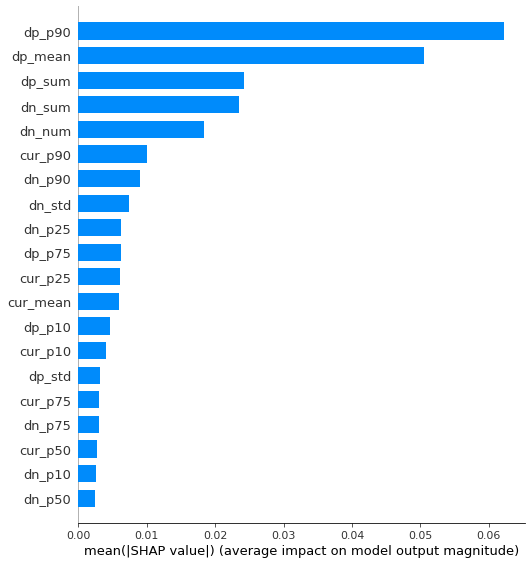

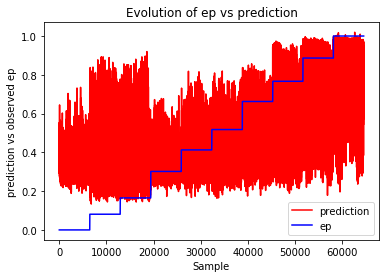

Current experiment: strains_curr_WG02_g20.txt, Completion: 53%


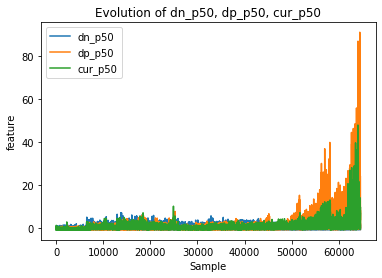

Train: [51672, 0.2319418646328996, 0.4730435080709736] 
Test: [12919, 0.24322004682381768, 0.42906230063414064]


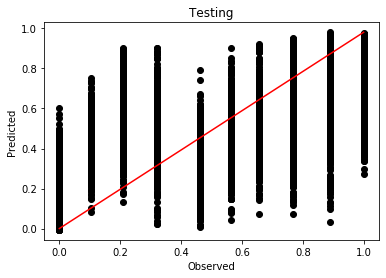

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


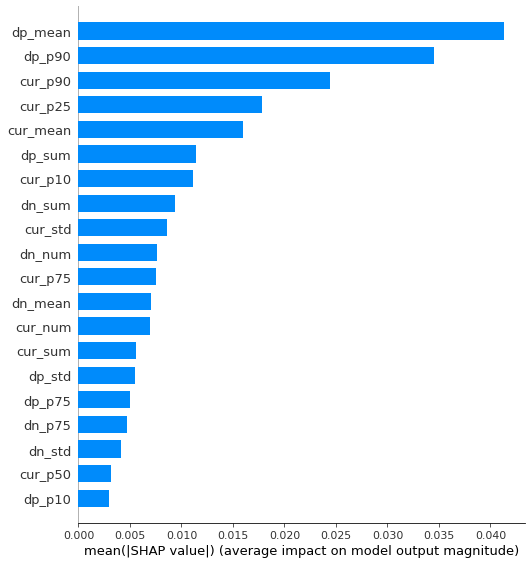

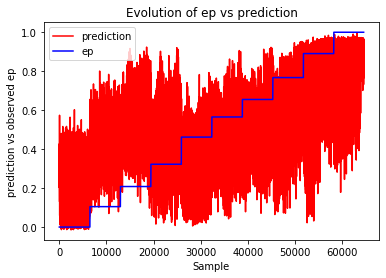

Current experiment: strains_curr_WG04_g20.txt, Completion: 60%


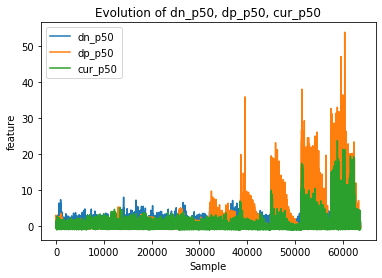

Train: [50948, 0.2264392989205325, 0.49559746286953565] 
Test: [12738, 0.24052986287442218, 0.42692945111049097]


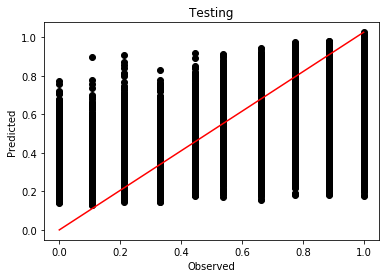

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


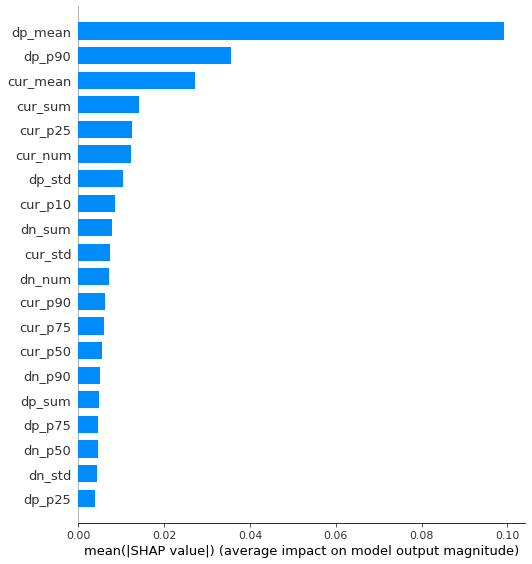

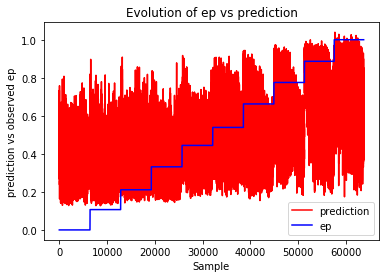

Current experiment: strains_curr_GRS02_g20.txt, Completion: 66%


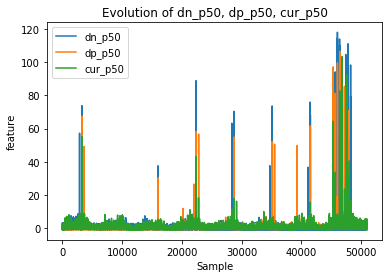

Train: [40751, 0.2208509984643212, 0.519250409598156] 
Test: [10188, 0.23776610721429117, 0.4415041050193491]


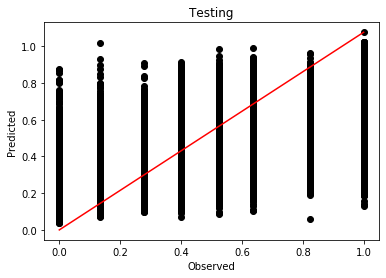

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


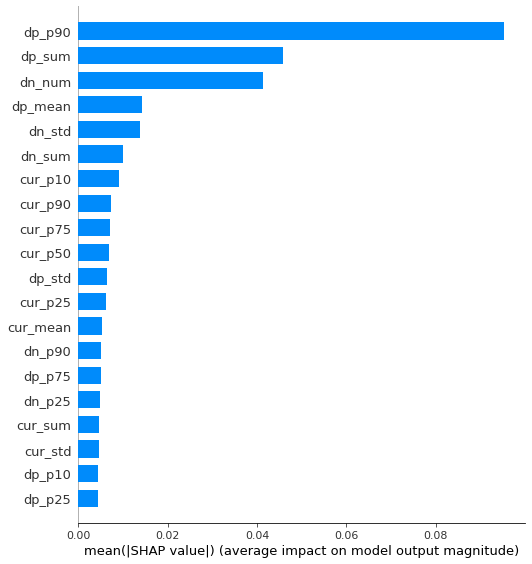

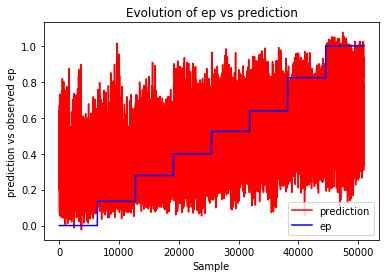

Current experiment: strains_curr_GRS03_g20.txt, Completion: 73%


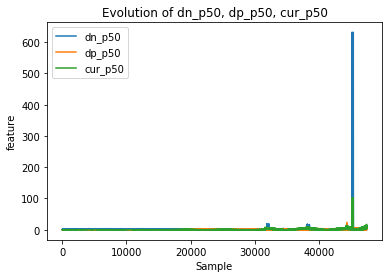

Train: [37950, 0.10367988658914498, 0.8969406631714864] 
Test: [9488, 0.11550100044510275, 0.8705024358778455]


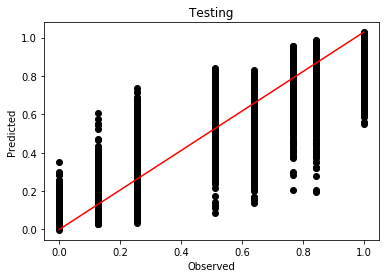

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


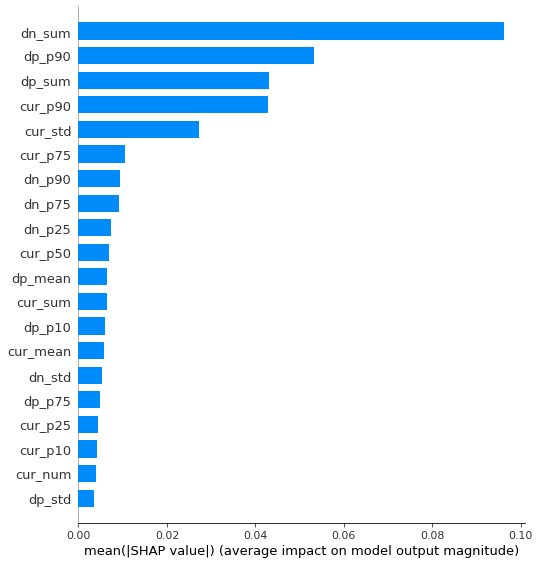

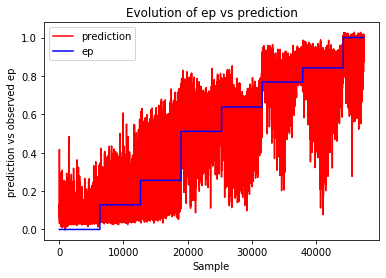

Current experiment: strains_curr_ANS02_g20.txt, Completion: 80%


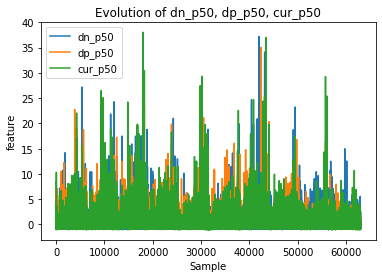

Train: [50412, 0.2669985150935724, 0.2092522661213424] 
Test: [12603, 0.28025500667533965, 0.12768077348792672]


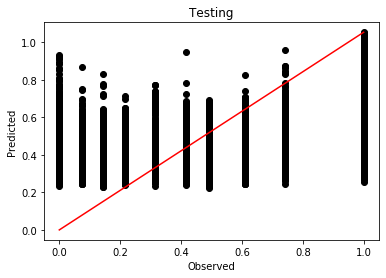

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


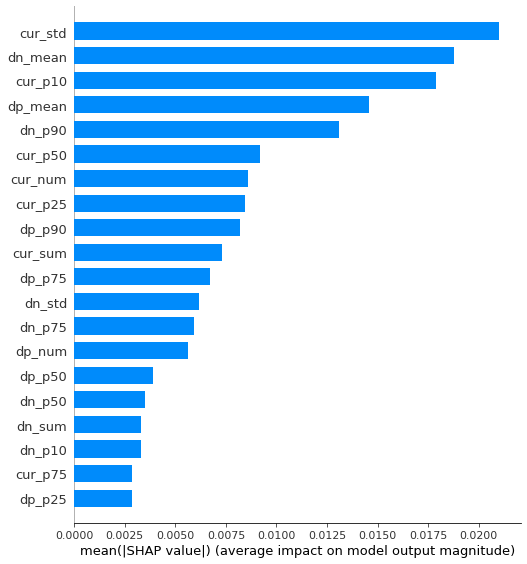

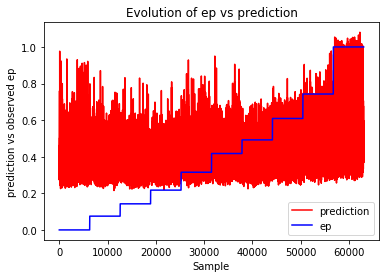

Current experiment: strains_curr_ANS03_g20.txt, Completion: 86%


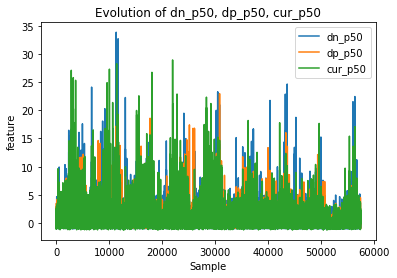

Train: [45937, 0.27342654233095387, 0.2330948294484234] 
Test: [11485, 0.28342595410018784, 0.18455263386241505]


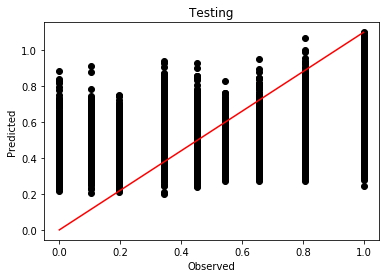

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


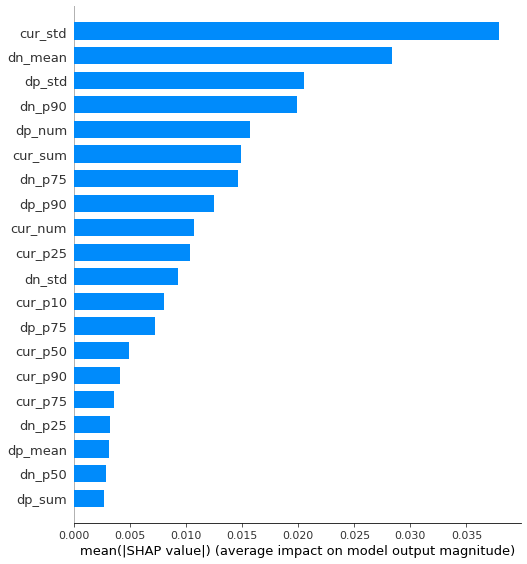

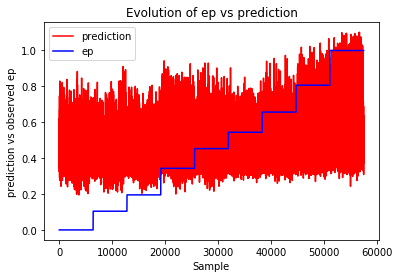

Current experiment: strains_curr_ANS04_g20.txt, Completion: 93%


Creating legend with loc="best" can be slow with large amounts of data.


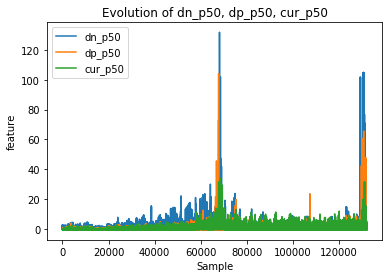

Train: [105574, 0.2217034106276627, 0.4188216008107214] 
Test: [26394, 0.2327932069742722, 0.3629351076248223]


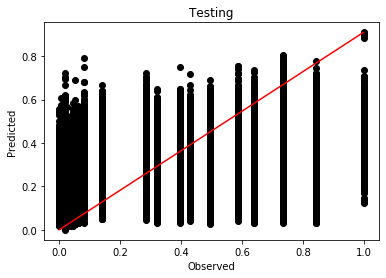

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


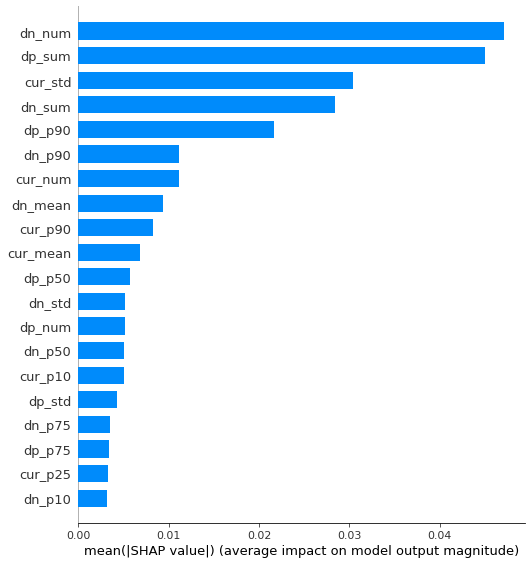

Creating legend with loc="best" can be slow with large amounts of data.


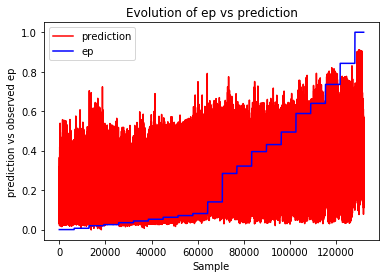

Current experiment: strains_curr_ANS05_g20.txt, Completion: 100%


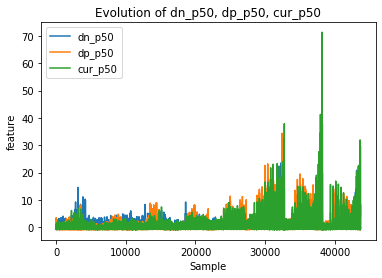

Train: [34920, 0.2595159346202938, 0.43636835983232314] 
Test: [8731, 0.2734150227982313, 0.3697222852048738]


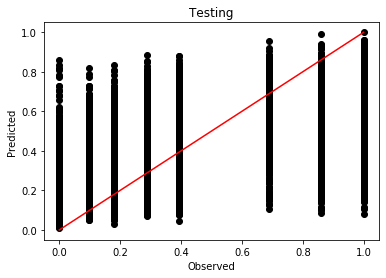

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


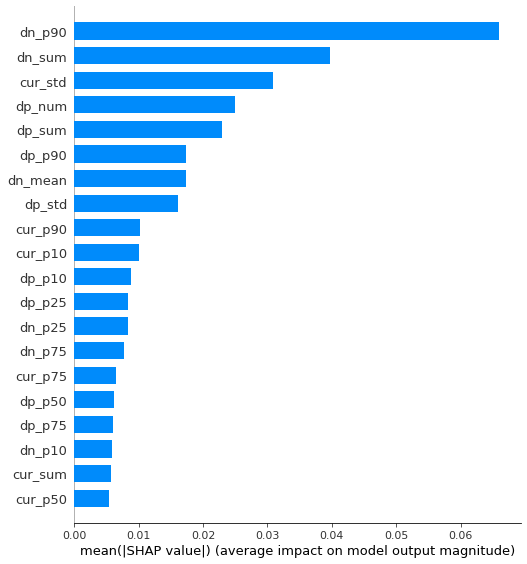

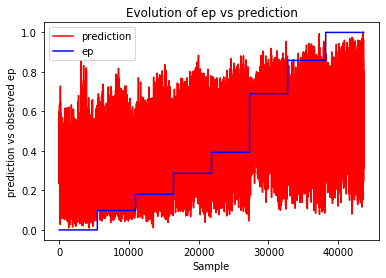

In [32]:
print(f"\nTraining xgb models on {num_exps} experiments, testing on same dataset. \nStoring models for later transfer learning:\n")

for i in range(num_exps):

    print("Current experiment: %s, Completion: %d%%" %(filenames[i],(100*(i+1)/num_exps)))

    dataframe, timespan = get_experiment_data(folder, filenames[i], experiments[i], features, target)
    #dataframe = remove_outliers(dataframe, dataframe['ep'], ['dn_p50', 'dp_p50', 'cur_p50'], threshold = 0.99, verbose=True)
    
    df_train, df_test = train_test_split(dataframe, test_size=conf['model_details']['test_size'])

    plot_data_time_evolutions(dataframe, [features[2],features[11],features[20]], ['Evolution of '+features[2]+', '+features[11]+', '+features[20],'Sample','feature']) #This is a dumb way to do it: features[2] if we use the small featurelist
    #plot_data_errorbars(dataframe, dataframe['ep'], [features[2],features[11],features[20]], ['Evolution of '+features[2]+', '+features[11]+', '+features[20],'ep','feature']) #This is a dumb way to do it: features[2] if we use the small featurelist
    
    train_time = time.time()
    model = train_xgb_model(df_train, target, features, conf) #other_model(df_train,target,features)
    models.append(model)
    train_time = time.time()-train_time
    
    with open(saved_models[i], 'wb') as file:
        pickle.dump(model,file)

    train_scores = test_regression_model(model,features,target,df_train)
    test_scores = test_regression_model(model,features,target,df_test)

    r2_train_vector[i] = train_scores[-1]
    r2_test_matrix[i,i] = test_scores[-1]

    print(f"Train: {train_scores}", f"\nTest: {test_scores}")

    plot_observed_vs_predicted(df_test, target, model, features, ['Testing','Observed','Predicted'])
    represent_model_results(model,df_train,features,target,train_scores)

    plot_feature_vs_prediction(dataframe, 'ep', model.predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])
    
    score_str+=(experiments[i]+" "+str(test_scores[1])+" "+str(test_scores[2]))+" "+str(train_time)+"\n"
    
    pred_vs_observed = np.column_stack((model.predict(dataframe[features]),dataframe['ep']))
    np.savetxt(result_folder+model_preds[i],pred_vs_observed)
    
save_data_by_name(score_str,result_folder,model_scores)


Performing tranfser learning, reprinting r2 scores 
and plotting score martix:

Train score on experiment FBL01: r2 = 0.5857134007054474
Test score: r2 = 0.55946300712331
Train score on experiment FBL02: r2 = 0.6695953226221103
Test score: r2 = 0.6177496985505229
Train score on experiment ETNA01: r2 = 0.7434955935119713
Test score: r2 = 0.6682270408060859
Train score on experiment ETNA02: r2 = 0.728544553666626
Test score: r2 = 0.6394587900941676
Train score on experiment MONZ04: r2 = 0.3979086814203354
Test score: r2 = 0.30793721013697595
Train score on experiment MONZ05: r2 = 0.4977427883833023
Test score: r2 = 0.4132494812913221
Train score on experiment WG01: r2 = 0.49445046516454294
Test score: r2 = 0.46504651429576127
Train score on experiment WG02: r2 = 0.4730435080709736
Test score: r2 = 0.42906230063414064
Train score on experiment WG04: r2 = 0.49559746286953565
Test score: r2 = 0.42692945111049097
Train score on experiment GRS02: r2 = 0.519250409598156
Test score: r2 = 0.441

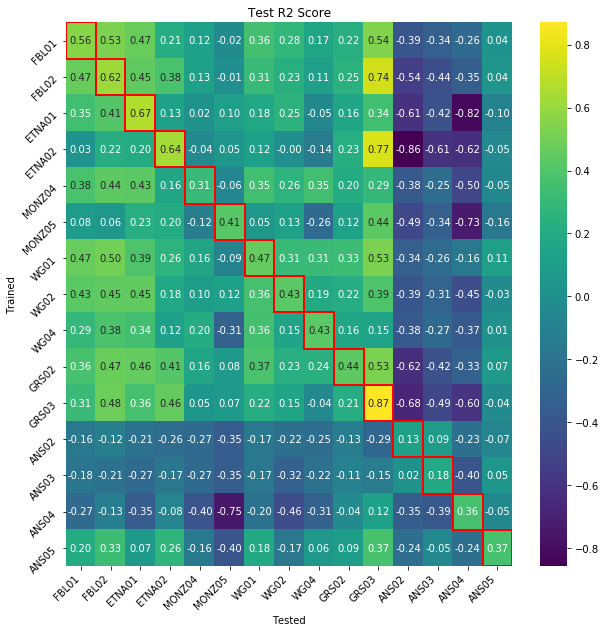

In [33]:
print("\nPerforming tranfser learning, reprinting r2 scores \nand plotting score martix:\n")
for i in range(len(models)):
    for j in range(num_exps):
        if j != i:
            dataframe, timespan = get_experiment_data(folder, filenames[j], experiments[j], features, target)
            scores = test_regression_model(models[i], features, target,dataframe)
            r2_test_matrix[i,j] = scores[-1]


    print(f"Train score on experiment {experiments[i]}: r2 = {r2_train_vector[i]}\nTest score: r2 = {r2_test_matrix[i,i]}")

plot_sns_score_matrix(r2_test_matrix,experiments,experiments,["Test R2 Score", "Tested", "Trained"])
np.savetxt(result_folder+model_score_matrix,r2_test_matrix)

We observe even more model variance on the larger datasets. This may be a good opportunity to test the models trained on the smaller g50 datasets on these larger g20 datasets. For now reviewing the model scores we see that they are far better when we do not remove the outliers. This could indicate that the outliers are important for the learning of our models. 

Another possibility is that the noise in our data is large enough that outliers help our models learn more than the rest of the data. I NEED TO READ UP ON THIS

### Training a neural network


Training nn models on 15 experiments, testing on same dataset. 
Storing models for later transfer learning:

Current experiment: strains_curr_FBL01_g20.txt, Completion: 6%
Train: [41017, 0.20951362084817532, 0.5472793569574128] 
Test: [10255, 0.20998429836352586, 0.5399067713236094]


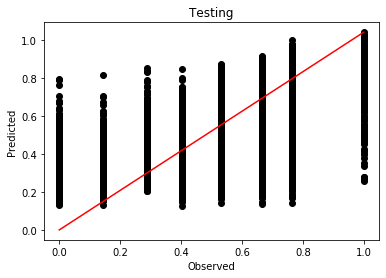

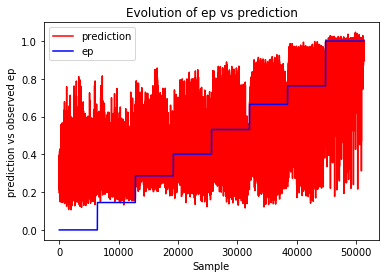

Current experiment: strains_curr_FBL02_g20.txt, Completion: 13%
Train: [51418, 0.1948044892137937, 0.6131836906259649] 
Test: [12855, 0.19506316243674954, 0.6126767196387924]


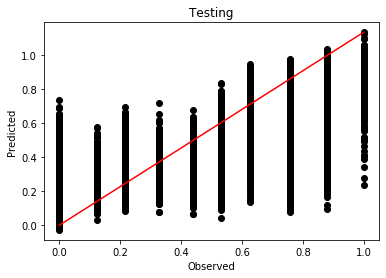

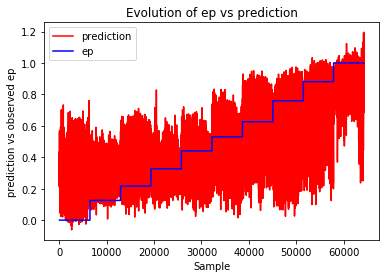

Current experiment: strains_curr_ETNA01_g20.txt, Completion: 20%
Train: [42516, 0.18471900487683018, 0.6638922407887013] 
Test: [10630, 0.18545412781395132, 0.6655663267494725]


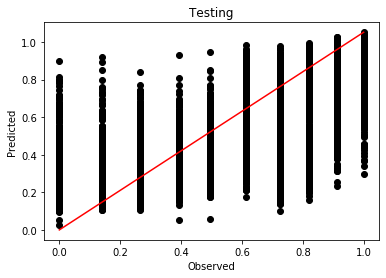

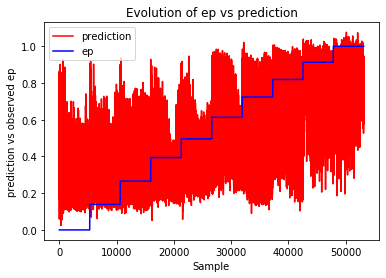

Current experiment: strains_curr_ETNA02_g20.txt, Completion: 26%
Train: [38492, 0.19768316720918688, 0.6311609899035184] 
Test: [9624, 0.19960804447216737, 0.6314196080714629]


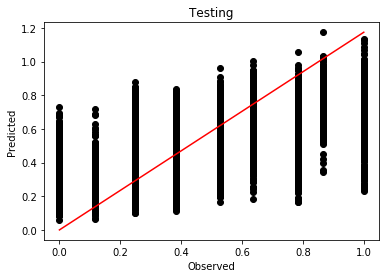

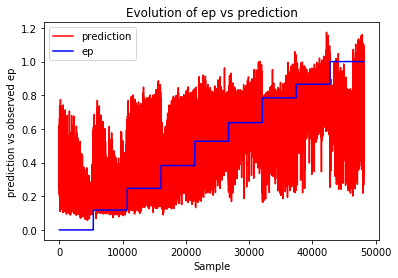

Current experiment: strains_curr_MONZ04_g20.txt, Completion: 33%
Train: [50284, 0.26674481387504867, 0.3095162596157942] 
Test: [12572, 0.26730936694943364, 0.30111212063455417]


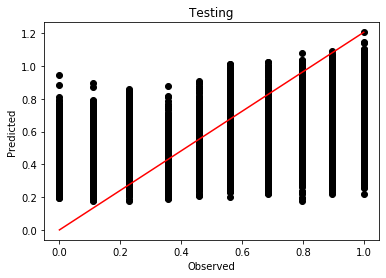

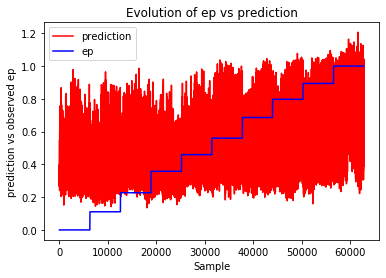

Current experiment: strains_curr_MONZ05_g20.txt, Completion: 40%
Train: [43196, 0.21811672209425081, 0.3934804122742368] 
Test: [10799, 0.21991235362292463, 0.39467282945907367]


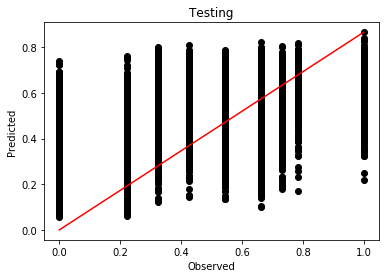

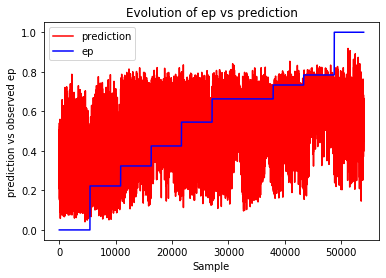

Current experiment: strains_curr_WG01_g20.txt, Completion: 46%
Train: [51642, 0.23935738742453772, 0.46931134465281377] 
Test: [12911, 0.24237553735072273, 0.4474636897557429]


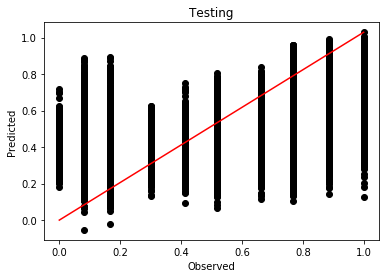

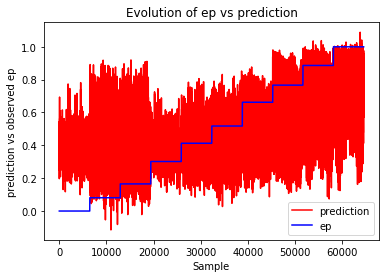

Current experiment: strains_curr_WG02_g20.txt, Completion: 53%
Train: [51672, 0.24143859952284824, 0.43035563770280494] 
Test: [12919, 0.24503129155711043, 0.4150766523158952]


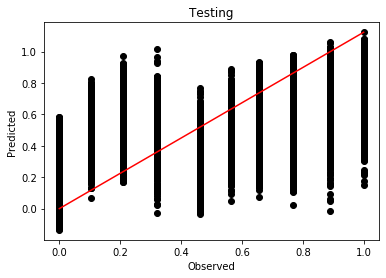

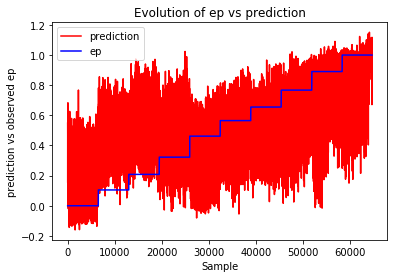

Current experiment: strains_curr_WG04_g20.txt, Completion: 60%
Train: [50948, 0.23893342793452238, 0.43757583963793445] 
Test: [12738, 0.23959375760940893, 0.4347195799978416]


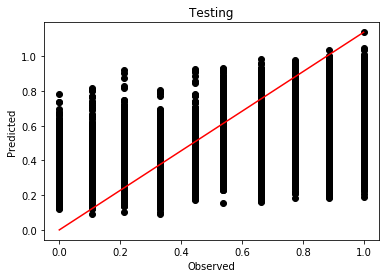

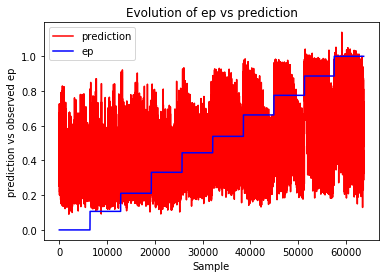

Current experiment: strains_curr_GRS02_g20.txt, Completion: 66%
Train: [40751, 0.23265050681119134, 0.4669788956313137] 
Test: [10188, 0.2404194981574554, 0.426961903064613]


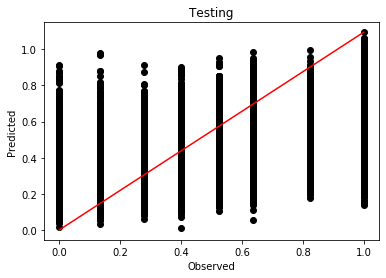

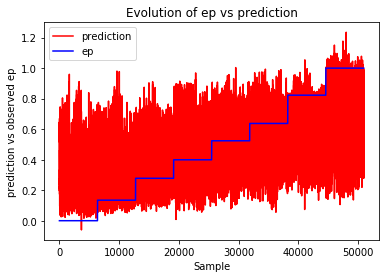

Current experiment: strains_curr_GRS03_g20.txt, Completion: 73%
Train: [37950, 0.11880677752203976, 0.8642079182763084] 
Test: [9488, 0.12060507200642125, 0.8607401575924959]


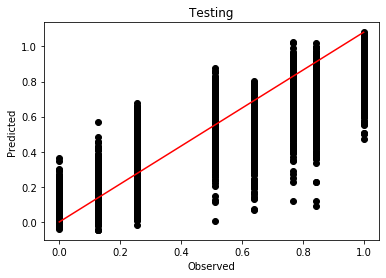

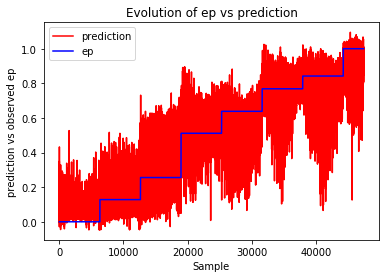

Current experiment: strains_curr_ANS02_g20.txt, Completion: 80%
Train: [50412, 0.27867063723033647, 0.13804256236082102] 
Test: [12603, 0.2817465928411457, 0.12066787039192284]


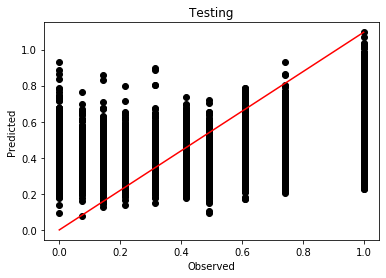

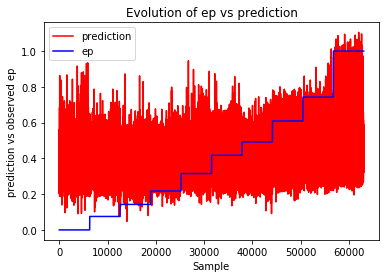

Current experiment: strains_curr_ANS03_g20.txt, Completion: 86%
Train: [45937, 0.28086459374281236, 0.19333388886921865] 
Test: [11485, 0.28521837530223926, 0.16396796762687293]


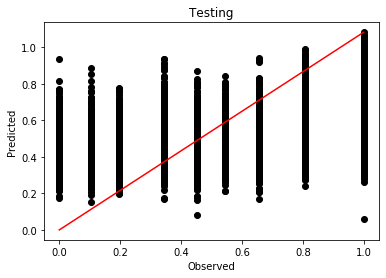

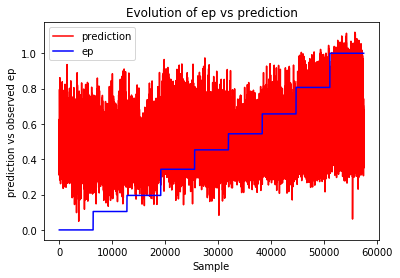

Current experiment: strains_curr_ANS04_g20.txt, Completion: 93%
Train: [105574, 0.23604905740986915, 0.3427180614474422] 
Test: [26394, 0.23700063497752674, 0.3334812277590967]


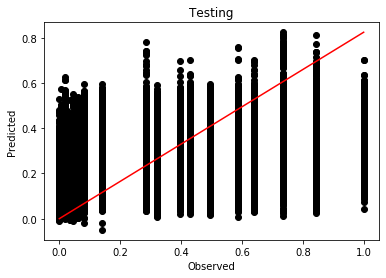

Creating legend with loc="best" can be slow with large amounts of data.


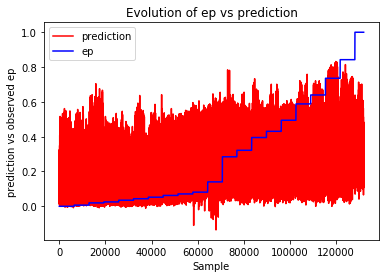

Current experiment: strains_curr_ANS05_g20.txt, Completion: 100%
Train: [34920, 0.27693209540449665, 0.3584366369735278] 
Test: [8731, 0.2779160461126039, 0.34763648371177946]


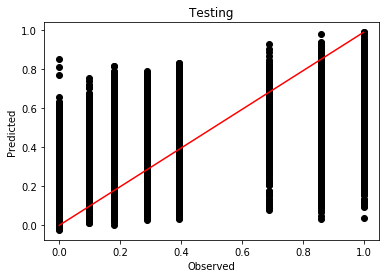

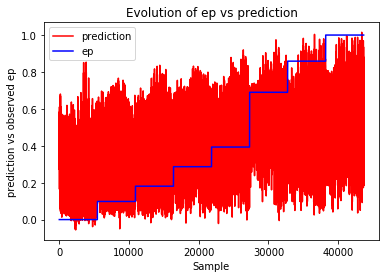

In [34]:
print(f"\nTraining nn models on {num_exps} experiments, testing on same dataset. \nStoring models for later transfer learning:\n")

models = []
score_str = "experiment r2 mse time\n"

for i in range(num_exps):

    print("Current experiment: %s, Completion: %d%%" %(filenames[i],(100*(i+1)/num_exps)))

    dataframe, timespan = get_experiment_data(folder, filenames[i], experiments[i], features, target)
    #dataframe = remove_outliers(dataframe, dataframe['ep'], ['dn_p50', 'dp_p50', 'cur_p50'], threshold = 0.97, verbose=True)
    #Removing outliers
    df_train, df_test = train_test_split(dataframe, test_size=conf['model_details']['test_size'])

    train_time = time.time()
    model = train_nn_model(df_train, target, features) #other_model(df_train,target,features)
    models.append(model)
    train_time = time.time() - train_time

    train_scores = test_regression_model(model,features,target,df_train)
    test_scores = test_regression_model(model,features,target,df_test)

    r2_train_vector[i] = train_scores[-1]
    r2_test_matrix[i,i] = test_scores[-1]

    print(f"Train: {train_scores}", f"\nTest: {test_scores}")

    pred_vs_observed = np.column_stack((model.predict(dataframe[features]),dataframe['ep']))
    np.savetxt(result_folder+nn_model_preds[i],pred_vs_observed)
    
    score_str+=(experiments[i]+" "+str(test_scores[1])+" "+str(test_scores[2]))+" "+str(train_time)+"\n"    
    
    plot_observed_vs_predicted(df_test, target, model, features, ['Testing','Observed','Predicted'])

    plot_feature_vs_prediction(dataframe, 'ep', model.predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])

save_data_by_name(score_str,result_folder,nn_model_scores)


Performing tranfser learning, reprinting r2 scores 
and plotting score martix:

Train score on experiment FBL01: r2 = 0.5472793569574128
Test score: r2 = 0.5399067713236094
Train score on experiment FBL02: r2 = 0.6131836906259649
Test score: r2 = 0.6126767196387924
Train score on experiment ETNA01: r2 = 0.6638922407887013
Test score: r2 = 0.6655663267494725
Train score on experiment ETNA02: r2 = 0.6311609899035184
Test score: r2 = 0.6314196080714629
Train score on experiment MONZ04: r2 = 0.3095162596157942
Test score: r2 = 0.30111212063455417
Train score on experiment MONZ05: r2 = 0.3934804122742368
Test score: r2 = 0.39467282945907367
Train score on experiment WG01: r2 = 0.46931134465281377
Test score: r2 = 0.4474636897557429
Train score on experiment WG02: r2 = 0.43035563770280494
Test score: r2 = 0.4150766523158952
Train score on experiment WG04: r2 = 0.43757583963793445
Test score: r2 = 0.4347195799978416
Train score on experiment GRS02: r2 = 0.4669788956313137
Test score: r2 = 0.

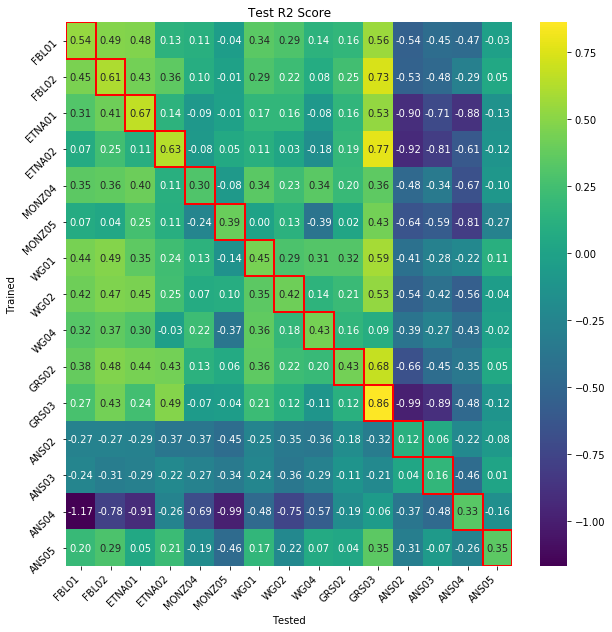

In [35]:
print("\nPerforming tranfser learning, reprinting r2 scores \nand plotting score martix:\n")
for i in range(len(models)):
    for j in range(num_exps):
        if j != i:
            dataframe, timespan = get_experiment_data(folder, filenames[j], experiments[j], features, target)
            scores = test_regression_model(models[i], features, target,dataframe)
            r2_test_matrix[i,j] = scores[-1]


    print(f"Train score on experiment {experiments[i]}: r2 = {r2_train_vector[i]}\nTest score: r2 = {r2_test_matrix[i,i]}")

plot_sns_score_matrix(r2_test_matrix,experiments,experiments,["Test R2 Score", "Tested", "Trained"])
np.savetxt(result_folder+nn_model_score_matrix,r2_test_matrix)

Our initial result was terrible compared to xgboost, but we could attempt using a different activation function or use regularization.

RESULTS AFTER TUNING THE NETWORK: Performance on the smaller dataset is still not that good, however testing the network on the larger g20 dataset we now see comparable results to xgboost.


Combining datasets to evaluate effect on model and performance

Datasets used for training: ['strains_curr_FBL01_g20.txt', 'strains_curr_FBL02_g20.txt']
Train: [92436, 0.20572991078359207, 0.5665675521303094] 
Test: [23109, 0.20668766154655385, 0.5606640446728441]


Creating legend with loc="best" can be slow with large amounts of data.


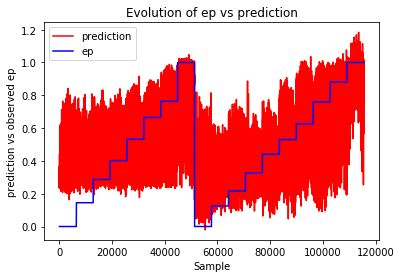


Datasets used for training: ['strains_curr_FBL01_g20.txt', 'strains_curr_ETNA01_g20.txt']
Train: [83534, 0.19919258163189785, 0.6044476749026025] 
Test: [20884, 0.20073905302890355, 0.5971990219166563]


Creating legend with loc="best" can be slow with large amounts of data.


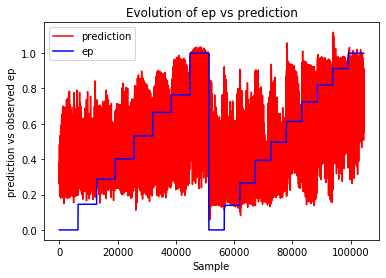


Datasets used for training: ['strains_curr_MONZ05_g20.txt', 'strains_curr_WG01_g20.txt']
Train: [94838, 0.23249313432674043, 0.4320470766862279] 
Test: [23710, 0.23500563861982288, 0.42131850522124425]


Creating legend with loc="best" can be slow with large amounts of data.


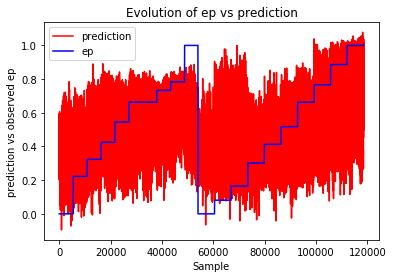


Datasets used for training: ['strains_curr_MONZ05_g20.txt', 'strains_curr_WG02_g20.txt']
Train: [94868, 0.2322415131811439, 0.41260548718052414] 
Test: [23718, 0.23520887942160215, 0.40226168724069344]


Creating legend with loc="best" can be slow with large amounts of data.


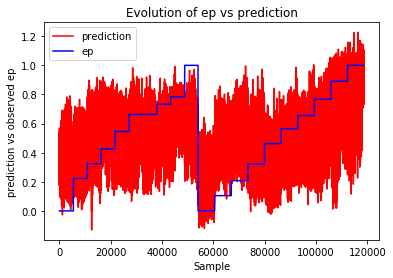


Datasets used for training: ['strains_curr_GRS02_g20.txt', 'strains_curr_GRS03_g20.txt']
Train: [78701, 0.18888909199986745, 0.6532879557472865] 
Test: [19676, 0.1922489661414589, 0.6374810607193835]


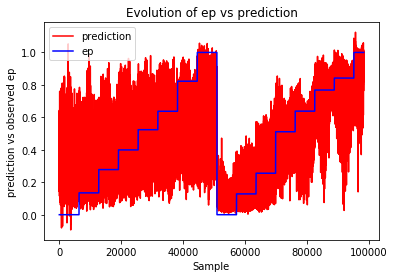


Datasets used for training: ['strains_curr_GRS03_g20.txt', 'strains_curr_ANS04_g20.txt']
Train: [143524, 0.21365602706966746, 0.5325528284232404] 
Test: [35882, 0.21585717644200364, 0.5245809226861581]


Creating legend with loc="best" can be slow with large amounts of data.


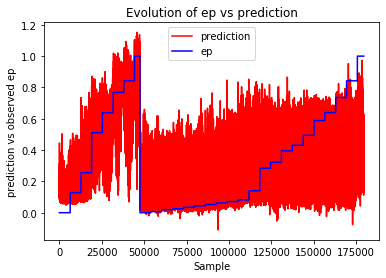


Datasets used for training: ['strains_curr_GRS03_g20.txt', 'strains_curr_ANS02_g20.txt']
Train: [88362, 0.22616013031675775, 0.4768199035497781] 
Test: [22091, 0.22718430317918323, 0.4748475553195083]


Creating legend with loc="best" can be slow with large amounts of data.


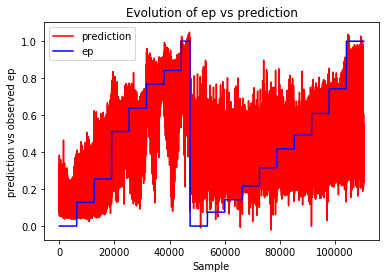


Datasets used for training: ['strains_curr_GRS03_g20.txt', 'strains_curr_ANS03_g20.txt']
Train: [83888, 0.22351316900037346, 0.5040391798493862] 
Test: [20972, 0.22926934501626664, 0.4797544861087568]


Creating legend with loc="best" can be slow with large amounts of data.


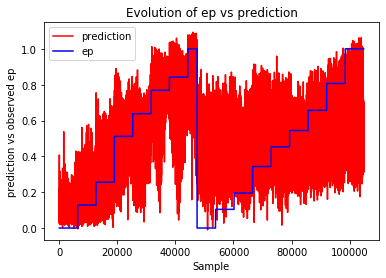


Datasets used for training: ['strains_curr_GRS02_g20.txt', 'strains_curr_GRS03_g20.txt', 'strains_curr_ANS03_g20.txt', 'strains_curr_ANS04_g20.txt']
Train: [230213, 0.23944731418067353, 0.4394950130543075] 
Test: [57554, 0.24148533632315566, 0.4273669366392996]


Creating legend with loc="best" can be slow with large amounts of data.


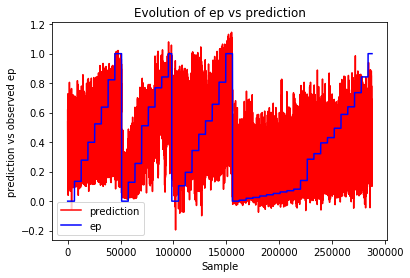

In [36]:
print("\nCombining datasets to evaluate effect on model and performance")
#['FBL01', 'FBL02', 'ETNA01', 'ETNA02', 'MONZ04', 'MONZ05', 'WG01', 'WG02', 'WG04', 'GRS02', 'GRS03', 'ANS02', 'ANS03', 'ANS04', 'ANS05']
filelist = [ [ filenames[0], filenames[1] ] , [ filenames[0], filenames[2] ], [ filenames[5], filenames[6] ], [ filenames[5], filenames[7] ], [ filenames[9], filenames[10] ], [ filenames[10], filenames[13] ], [ filenames[10], filenames[11] ], [ filenames[10], filenames[12] ], [ filenames[9], filenames[10], filenames[12], filenames[13] ] ] #THIS IS INEFFICIENT, BUT SUFFICIENT FOR TESTING
experimentlist = [ [ experiments[0], experiments[1] ] , [ experiments[0], experiments[2] ], [ experiments[5], experiments[6] ], [ experiments[5], experiments[7] ], [ experiments[9], experiments[10] ], [ experiments[10], experiments[13] ], [ experiments[10], experiments[11] ], [ experiments[10], experiments[12] ], [ experiments[9], experiments[10], experiments[12], experiments[13] ] ]
num_train_sets = len(filelist)

#fbl-etna
#monz-wg
#grs-ans

multi_models = []

r2_multi_test_matrix = np.zeros((num_train_sets,num_exps))

for i in range(num_train_sets):
    print(f"\nDatasets used for training: {filelist[i]}")
    dataframe, timespan = get_experiment_data(folder, filelist[i], experiments, features, target)

    df_train, df_test = train_test_split(dataframe, test_size=conf['model_details']['test_size'])

    multi_model = train_nn_model(df_train, target, features) #other_model(df_train,target,features)
    multi_models.append(multi_model)

    train_scores = test_regression_model(multi_model,features,target,df_train)
    test_scores = test_regression_model(multi_model,features,target,df_test)

    print(f"Train: {train_scores}", f"\nTest: {test_scores}")

    plot_feature_vs_prediction(dataframe, 'ep', multi_model.predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])
    
    for j in range(num_exps):
        dataframe, timespan = get_experiment_data(folder, filenames[j], experiments[j], features, target)
        scores = test_regression_model(multi_models[i], features, target,dataframe)
        r2_multi_test_matrix[i,j] = scores[-1]

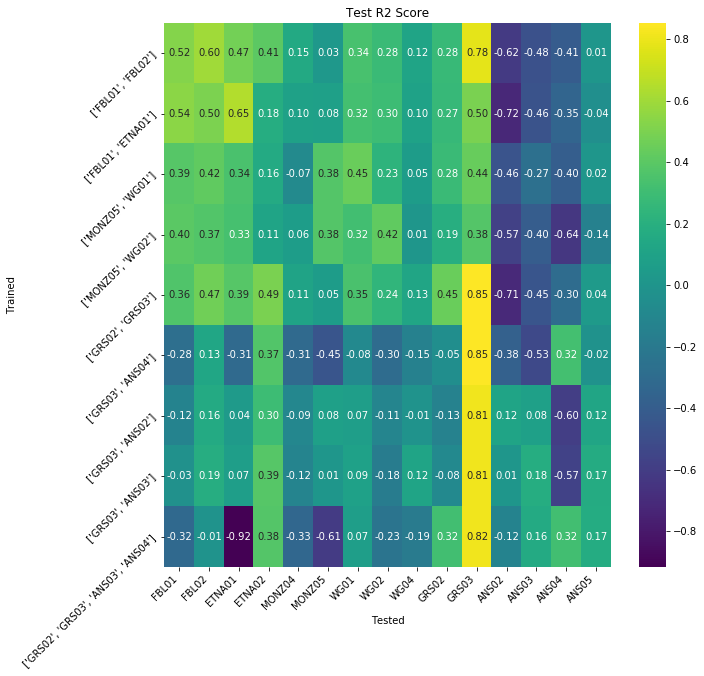

In [37]:
plot_sns_score_matrix(r2_multi_test_matrix,experimentlist,experiments,["Test R2 Score", "Tested", "Trained"], diagonal=False)

First thought when reiewing the results is that the model could be very sensistive to outliers. Allthemore a good reason to find a good system for removing them.

My thought after attempting to remove outliers is that we should try something else instead.

Another thing to note is that the multiple dataset transfer learning is not as good for NN at g20 as XGB at g50, however this may be an effect of the datasets, which hould be tested.